In [1]:
#!pip install pmdarima
#!pip install arch


In [2]:
#!pip install altair

In [3]:
import pandas as pd
import numpy as np

#Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
sns.set_style("whitegrid")
%matplotlib inline
import altair as alt 
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error
from arch import arch_model
from scipy.stats import shapiro
from scipy.stats import probplot
from statsmodels.stats.diagnostic import het_arch
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox

In [4]:
daily = pd.read_csv("daily_2009_to_2021.csv",parse_dates=['Date'], dayfirst=True)
weekly = pd.read_csv("weekly_2009_to_2021.csv",parse_dates=['Date'], dayfirst=True)
monthly = pd.read_csv("monthly_2009_to_2021.csv",parse_dates=['Date'], dayfirst=True)
## print shape of dataset with rows and columns and information 
print ("The shape of the  data is (row, column):"+ str(daily.shape))
print (daily.info())

The shape of the  data is (row, column):(3150, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3150 entries, 0 to 3149
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       3150 non-null   datetime64[ns]
 1   Open       3150 non-null   float64       
 2   High       3150 non-null   float64       
 3   Low        3150 non-null   float64       
 4   Close      3150 non-null   float64       
 5   Adj Close  3150 non-null   float64       
 6   Volume     3150 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 172.4 KB
None


In [5]:
daily.describe()

,Open,High,Low,Close,Adj Close,Volume
count,3150.000000,3150.000000,3150.000000,3150.000000,3150.000000,3.150000e+03
mean,8327.197874,8372.445717,8268.142789,8321.235764,8321.235764,2.070822e+05
std,3225.224571,3231.992735,3207.340105,3220.165362,3220.165362,2.248483e+05
min,2574.500000,2621.250000,2539.449951,2573.149902,2573.149902,0.000000e+00
25%,5577.074951,5615.849975,5548.575074,5574.224854,5574.224854,0.000000e+00
50%,8033.600098,8087.399902,7969.025147,8033.074952,8033.074952,1.616000e+05
75%,10612.587890,10643.712402,10546.987550,10597.900390,10597.900390,2.792500e+05
max,18602.349610,18604.449220,18445.300780,18477.050780,18477.050780,1.811000e+06


In [6]:
daily.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2009-01-02,3034.600098,3079.850098,3021.800049,3046.750000,3046.750000,0
1,2009-01-05,3058.750000,3131.949951,3056.449951,3121.449951,3121.449951,0
2,2009-01-06,3121.500000,3141.800049,3056.100098,3112.800049,3112.800049,0
3,2009-01-07,3112.800049,3147.199951,2888.199951,2920.399902,2920.399902,0
4,2009-01-09,2919.949951,2929.850098,2810.250000,2873.000000,2873.000000,0


In [7]:
#Creating a copy
daily_analysis=daily.copy()

#Coverting date column to datetime data type
#daily_analysis['Date'] = daily_analysis['Date'].apply(pd.to_datetime)

#Extracting Month, Week, Day,Day of week
daily_analysis["Month"] = daily_analysis.Date.dt.month
daily_analysis["Week"] = daily_analysis.Date.dt.week
daily_analysis["Day"] = daily_analysis.Date.dt.day
daily_analysis["Day of week"] = daily_analysis.Date.dt.dayofweek


#Setting date column as index
daily_analysis.set_index("Date", drop=False, inplace=True)
daily_analysis.iloc[:,15:19].head()
#Imputing null values with mean 
daily_analysis.fillna(daily_analysis.mean(),inplace=True)

#Checking for null values
daily_analysis.isnull().sum()

Date           0
Open           0
High           0
Low            0
Close          0
Adj Close      0
Volume         0
Month          0
Week           0
Day            0
Day of week    0
dtype: int64

In [8]:
daily_analysis.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Week,Day,Day of week
Date,,,,,,,,,,,
2009-01-02,2009-01-02,3034.600098,3079.850098,3021.800049,3046.750000,3046.750000,0,1,1,2,4
2009-01-05,2009-01-05,3058.750000,3131.949951,3056.449951,3121.449951,3121.449951,0,1,2,5,0
2009-01-06,2009-01-06,3121.500000,3141.800049,3056.100098,3112.800049,3112.800049,0,1,2,6,1
2009-01-07,2009-01-07,3112.800049,3147.199951,2888.199951,2920.399902,2920.399902,0,1,2,7,2
2009-01-09,2009-01-09,2919.949951,2929.850098,2810.250000,2873.000000,2873.000000,0,1,2,9,4


In [9]:
def plot_prices(analysis):
    #Size and style of the plot
    plt.figure(figsize = (15, 7))
    plt.style.use('seaborn-white')
    plt.subplot(231)
    sns.distplot(analysis['Open'])
    fig = plt.gcf()
    fig.set_size_inches(10,10)

    plt.subplot(232)
    sns.distplot(analysis['High'])
    fig = plt.gcf()
    fig.set_size_inches(10,10)

    plt.subplot(233)
    sns.distplot(analysis['Low'])
    fig = plt.gcf()
    fig.set_size_inches(10,10)

    plt.subplot(234)
    sns.distplot(analysis['Close'])
    fig = plt.gcf()
    fig.set_size_inches(10,10)

    plt.subplot(235)
    sns.distplot(analysis['Volume'])
    fig = plt.gcf()
    fig.set_size_inches(10,10)
    
    cols_plot = ['Open', 'Close', 'High','Low']
    axes = analysis[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
    for ax in axes:
        ax.set_ylabel('Daily trade')
        
    ax=analysis[['Volume']].plot(stacked=True)
    ax.set_title('Volume over years',fontsize= 30)
    ax.set_xlabel('Year',fontsize = 20)
    ax.set_ylabel('Volume',fontsize = 20)
    plt.show()

In [10]:
def compare_prices(analysis, price1, price2):
    fig = go.Figure()
    fig.add_trace(go.Scatter(
             x=analysis['Date'],
             y=analysis[price1],
             name=price1,
        line=dict(color='blue'),
        opacity=0.8))

    fig.add_trace(go.Scatter(
             x=analysis['Date'],
             y=analysis[price2],
             name=price2,
        line=dict(color='red'),
        opacity=0.8))

    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        )
    )


    fig.update_layout(title_text=f'{price1} Vs {price2}',plot_bgcolor='rgb(248, 248, 255)',yaxis_title='Value')

    fig.show()


In [11]:
compare_prices(daily_analysis, 'Open', 'Close')
compare_prices(daily_analysis, 'High', 'Low')

In [12]:
#Making a copy
daily_lag=daily_analysis.copy()
#Reset index
daily_lag.reset_index(drop=True, inplace=True)
#Creating lag features
lag_features = ["High", "Low", "Volume"]

# Taking the number of days in window
window1 = 3
window2 = 7
window3 = 30

#Rolling mean
df_rolled_3d = daily_lag[lag_features].rolling(window=window1, min_periods=0)
df_rolled_7d = daily_lag[lag_features].rolling(window=window2, min_periods=0)
df_rolled_30d = daily_lag[lag_features].rolling(window=window3, min_periods=0)

#Moving average
df_mean_3d = df_rolled_3d.mean().shift(1).reset_index().astype(np.float32)
df_mean_7d = df_rolled_7d.mean().shift(1).reset_index().astype(np.float32)
df_mean_30d = df_rolled_30d.mean().shift(1).reset_index().astype(np.float32)

#Standard deviation
df_std_3d = df_rolled_3d.std().shift(1).reset_index().astype(np.float32)
df_std_7d = df_rolled_7d.std().shift(1).reset_index().astype(np.float32)
df_std_30d = df_rolled_30d.std().shift(1).reset_index().astype(np.float32)

# Adding the features to the dataframe
for feature in lag_features:
    daily_lag[f"{feature}_mean_lag{window1}"] = df_mean_3d[feature]
    daily_lag[f"{feature}_mean_lag{window2}"] = df_mean_7d[feature]
    daily_lag[f"{feature}_mean_lag{window3}"] = df_mean_30d[feature]
    
    daily_lag[f"{feature}_std_lag{window1}"] = df_std_3d[feature]
    daily_lag[f"{feature}_std_lag{window2}"] = df_std_7d[feature]
    daily_lag[f"{feature}_std_lag{window3}"] = df_std_30d[feature]

daily_lag.fillna(daily_lag.mean(), inplace=True)

#Setting Date as index
daily_lag.set_index("Date", drop=False, inplace=True)
daily_lag.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Week,Day,...,Low_mean_lag30,Low_std_lag3,Low_std_lag7,Low_std_lag30,Volume_mean_lag3,Volume_mean_lag7,Volume_mean_lag30,Volume_std_lag3,Volume_std_lag7,Volume_std_lag30
Date,,,,,,,,,,,,,,,,,,,,,
2009-01-02,2009-01-02,3034.600098,3079.850098,3021.800049,3046.750000,3046.750000,0,1,1,2,...,8196.940430,57.524811,90.805283,188.087311,206949.015625,206754.203125,205629.890625,36767.546875,45042.210938,55429.414062
2009-01-05,2009-01-05,3058.750000,3131.949951,3056.449951,3121.449951,3121.449951,0,1,2,5,...,3021.800049,57.524811,90.805283,188.087311,0.000000,0.000000,0.000000,36767.546875,45042.210938,55429.414062
2009-01-06,2009-01-06,3121.500000,3141.800049,3056.100098,3112.800049,3112.800049,0,1,2,6,...,3039.125000,24.501181,24.501181,24.501181,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2009-01-07,2009-01-07,3112.800049,3147.199951,2888.199951,2920.399902,2920.399902,0,1,2,7,...,3044.783447,19.904905,19.904905,19.904905,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2009-01-09,2009-01-09,2919.949951,2929.850098,2810.250000,2873.000000,2873.000000,0,1,2,9,...,3005.637451,97.038345,79.960793,79.960793,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [13]:
#Printing the high curve
fig = go.Figure()
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['High'],
         name='High',
    line=dict(color='green'),
    opacity=0.8))

#Printing the low curve
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['Low'],
         name='Low',
    line=dict(color='orange'),
    opacity=0.8))

#Printing the high lag mean-30 days curve
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['High_mean_lag30'],
         name='High_mean_lag30',
    line=dict(color='red'),
    opacity=0.8))

#Printing the high lag standard deviation-30 days curve
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['High_std_lag30'],
         name='High_std_lag30',
    line=dict(color='royalblue'),
    opacity=0.8))

#Printing the low lag mean-30 days curve
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['Low_mean_lag30'],
         name='Low_mean_lag30',
    line=dict(color='yellow'),
    opacity=0.8))

#Printing the low lag standard deviation-30 days curve
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['Low_std_lag30'],
         name='Low_std_lag30',
    line=dict(color='pink'),
    opacity=0.8))

#Updating the time axis
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
        
#Update the title   
fig.update_layout(title_text='High Vs Low with mean lag and standard deviation lag',plot_bgcolor='rgb(248, 248, 255)',yaxis_title='Value')

fig.show()

In [14]:
#Printing the Volume curve
fig = go.Figure()
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['Volume'],
         name='Volume',
    line=dict(color='green'),
    opacity=0.8))

#Printing the Volume_mean_lag-30 days curve
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['Volume_mean_lag30'],
         name='Volume_mean_lag30',
    line=dict(color='yellow'),
    opacity=0.8))
#Printing the Volume_std_lag30 curve
fig.add_trace(go.Scatter(
         x=daily_lag['Date'],
         y=daily_lag['Volume_std_lag30'],
         name='Volume_std_lag30',
    line=dict(color='blue'),
    opacity=0.8))

#Updating time axis
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
        
#Updating layout 
fig.update_layout(title_text='Volume with mean lag and standard deviation lag',plot_bgcolor='rgb(248, 248, 255)',yaxis_title='Value')

fig.show()


In [15]:
#Setting the range of base plot
fig = px.line(daily_analysis, x='Date', y='Close',title='close price during Phase 1 Lockdown(25 March – 14 April) and Phase 2 Lockdown (15 April – 3 May)', range_x=['2020-01-01','2020-06-30'])

# Adding the shape in the dates
fig.update_layout(
    shapes=[
        # First phase Lockdown
        dict(
            type="rect",
            xref="x",
            yref="paper",
            x0="2020-03-23",
            y0=0,
            x1="2020-04-14",
            y1=1,
            fillcolor="LightSalmon",
            opacity=0.5,
            layer="below",
            line_width=0,
        ),
        # Second phase Lockdown
        dict(
            type="rect",
            xref="x",
            yref="paper",
            x0="2020-04-15",
            y0=0,
            x1="2020-05-03",
            y1=1,
            fillcolor="Green",
            opacity=0.5,
            layer="below",
            line_width=0,
        )],
    annotations=[dict(x='2020-04-15', y=0.99, xref='x', yref='paper',
                    showarrow=False, xanchor='right', text='Phase 1 Lockdown'),
                 dict(x='2020-05-12', y=0.99, xref='x', yref='paper',
                    showarrow=False, xanchor='right', text='Phase 2 Lockdown')])

fig.show()

In [16]:
fig = px.line(daily_analysis, x='Date', y='Close',title='Close price after lockdown', range_x=['2020-03-23','2020-06-30'])
fig.show()

In [17]:
daily_analysis_lockdown = daily_analysis[daily_analysis['Date'] >= '2020-03-23']
fig = go.Figure(data=[go.Candlestick(x=daily_analysis_lockdown['Date'],
                open=daily_analysis_lockdown['Open'],
                high=daily_analysis_lockdown['High'],
                low=daily_analysis_lockdown['Low'],
                close=daily_analysis_lockdown['Close'])])

fig.show()

<AxesSubplot:xlabel='Date'>

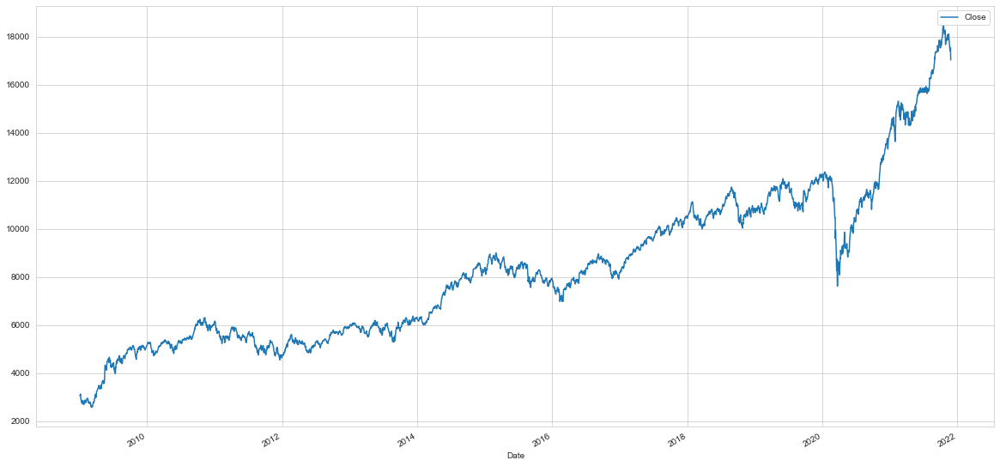

In [18]:
daily_stationarity=daily_analysis[['Close']]
daily_stationarity.plot()

In [19]:
test_result=adfuller(daily_stationarity['Close'])

#Ho: Data is non stationary
#H1: Data is stationary

def adfuller_test(price):
    result=adfuller(price)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

adfuller_test(daily_stationarity['Close'])

ADF Test Statistic : 0.1897035513684631
p-value : 0.9716781485590602
#Lags Used : 12
Number of Observations Used : 3137
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


<AxesSubplot:xlabel='Date'>

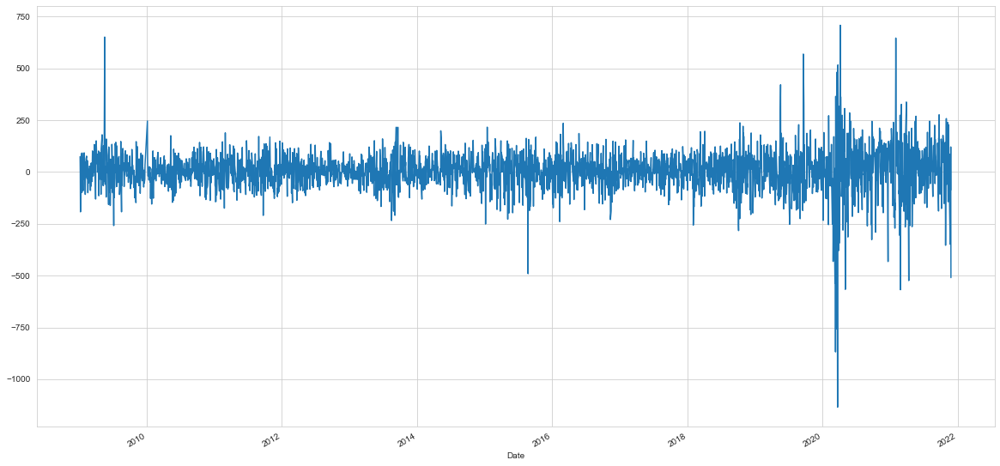

In [20]:
daily_stationarity['Close First Difference']=daily_stationarity['Close']-daily_stationarity['Close'].shift(1)
daily_stationarity['Close First Difference'].plot()

In [21]:
train_before_lockdown = daily_lag[daily_lag.Date < "2019"]
valid_before_lockdown = daily_lag[daily_lag.Date >= "2019"][daily_lag.Date < "2020"]
train_including_lockdown = daily_lag[daily_lag.Date < "2021"]
valid_including_lockdown = daily_lag[daily_lag.Date >= "2021"]

In [22]:
exogenous_features_with_vlolume = ['High_mean_lag3','High_mean_lag7', 'High_mean_lag30', 'High_std_lag3', 'High_std_lag7',
       'High_std_lag30', 'Low_mean_lag3', 'Low_mean_lag7', 'Low_mean_lag30',
       'Low_std_lag3', 'Low_std_lag7', 'Low_std_lag30', 'Volume_mean_lag3',
       'Volume_mean_lag7', 'Volume_mean_lag30', 'Volume_std_lag3',
       'Volume_std_lag7', 'Volume_std_lag30', 'Month', 'Week', 'Day', 'Day of week']
exogenous_features = ['High_mean_lag3','High_mean_lag7', 'High_mean_lag30', 'High_std_lag3', 'High_std_lag7',
       'High_std_lag30', 'Low_mean_lag3', 'Low_mean_lag7', 'Low_mean_lag30',
       'Low_std_lag3', 'Low_std_lag7', 'Low_std_lag30', 'Month', 'Week', 'Day', 'Day of week']

In [23]:
def model(train, valid, exogenous_features, seasonal):
    model = auto_arima(train['Close'], exogenous=train[exogenous_features], seasonal=seasonal, trace=True, error_action="ignore", suppress_warnings=True)
    model.fit(train['Close'], exogenous=train[exogenous_features])
    train["Forecast_ARIMAX"] =model.predict(n_periods=len(train), exogenous=train[exogenous_features])
    valid["Forecast_ARIMAX"] = model.predict(n_periods=len(valid), exogenous=valid[exogenous_features])
    train[["Close", "Forecast_ARIMAX"]].plot()
    valid[["Close", "Forecast_ARIMAX"]].plot()
    print("train MSE of Auto ARIMAX:", mean_squared_error(train['Close'], train.Forecast_ARIMAX))
    print("train RMSE of Auto ARIMAX:", np.sqrt(mean_squared_error(train['Close'], train.Forecast_ARIMAX)))
    print("train MAE of Auto ARIMAX:", mean_absolute_error(train['Close'], train.Forecast_ARIMAX))
    print("valid MSE of Auto ARIMAX:", mean_squared_error(valid['Close'], valid.Forecast_ARIMAX))
    print("valid RMSE of Auto ARIMAX:", np.sqrt(mean_squared_error(valid['Close'], valid.Forecast_ARIMAX)))
    print("valid MAE of Auto ARIMAX:", mean_absolute_error(valid['Close'], valid.Forecast_ARIMAX))
    return model

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=33264.541, Time=8.73 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=31157.991, Time=2.92 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=32116.578, Time=9.58 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=33374.529, Time=3.96 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=47732.823, Time=1.64 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=33145.573, Time=5.45 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 32.315 seconds
train MSE of Auto ARIMAX: 20385.48596265323
train RMSE of Auto ARIMAX: 142.7777502366991
train MAE of Auto ARIMAX: 75.99328699118163
valid MSE of Auto ARIMAX: 17154.399401155504
valid RMSE of Auto ARIMAX: 130.9748044516788
valid MAE of Auto ARIMAX: 99.21523713017696


C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2438
Model:                        SARIMAX   Log Likelihood              -15554.995
Date:                Mon, 29 Nov 2021   AIC                          31157.991
Time:                        01:17:50   BIC                          31297.165
Sample:                             0   HQIC                         31208.582
                               - 2438                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
intercept             0.4221     35.536      0.012      0.991     -69.228      70.072
High_mean_lag3        0.3889      0.242      1.609      0.108      -0.085       0.863
High_mean_lag7        0.1090      0.379      0.288      0.773      -0.633       0.852
High_mean_lag30      -0.0666      0.348     -0.191      0.849      -0.750       0.616
High_std_lag3         0.4063      0.170      2.389      0.017       0.073       0.740
High_std_lag7         0.2606      0.279      0.934      0.351      -0.286       0.808
High_std_lag30        0.1241      0.385      0.322      0.747      -0.631       0.879
Low_mean_lag3         0.9495      0.227      4.189      0.000       0.505       1.394
Low_mean_lag7        -0.4702      0.367     -1.281      0.200      -1.190       0.249
Low_mean_lag30        0.0869      0.348      0.250      0.803      -0.595       0.769
Low_std_lag3         -0.0756      0.170     -0.444      0.657      -0.409       0.258
Low_std_lag7         -0.2878      0.269     -1.070      0.285      -0.815       0.239
Low_std_lag30        -0.1155      0.397     -0.291      0.771      -0.893       0.662
Volume_mean_lag3      0.0001      0.000      0.737      0.461      -0.000       0.001
Volume_mean_lag7     -0.0004      0.000     -1.384      0.166      -0.001       0.000
Volume_mean_lag30     0.0002      0.000      1.051      0.293      -0.000       0.001
Volume_std_lag3    9.794e-05      0.000      0.536      0.592      -0.000       0.000
Volume_std_lag7    4.018e-05      0.000      0.167      0.868      -0.000       0.001
Volume_std_lag30   4.002e-05      0.000      0.130      0.896      -0.001       0.001
Month                 3.8373     13.457      0.285      0.776     -22.537      30.212
Week                 -0.5634      3.087     -0.183      0.855      -6.614       5.487
Day                   0.5640      0.662      0.852      0.394      -0.733       1.861
Day of week          -2.3581      3.023     -0.780      0.435      -8.282       3.566
sigma2             2.039e+04    113.650    179.372      0.000    2.02e+04    2.06e+04
===================================================================================
Ljung-Box (L1) (Q):                 171.41   Jarque-Bera (JB):          57024519.07
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.23   Skew:                           -20.42
Prob(H) (two-sided):                  0.00   Kurtosis:                       751.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

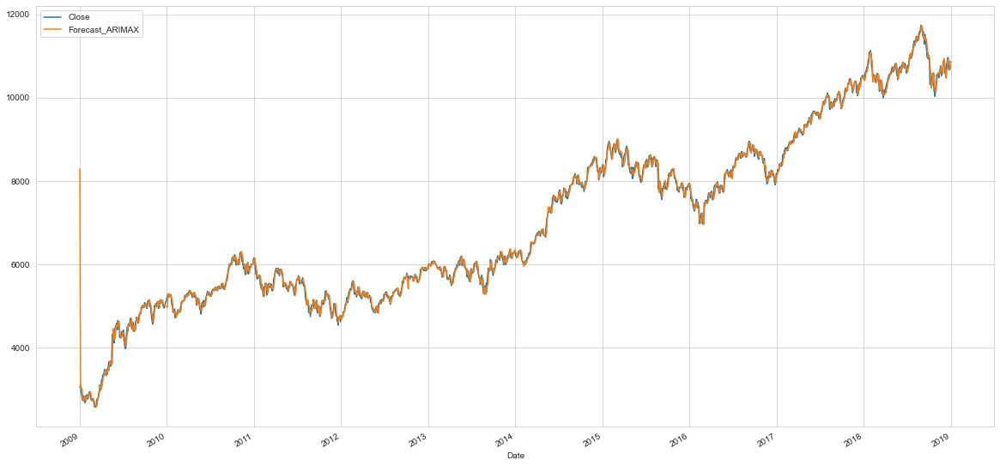

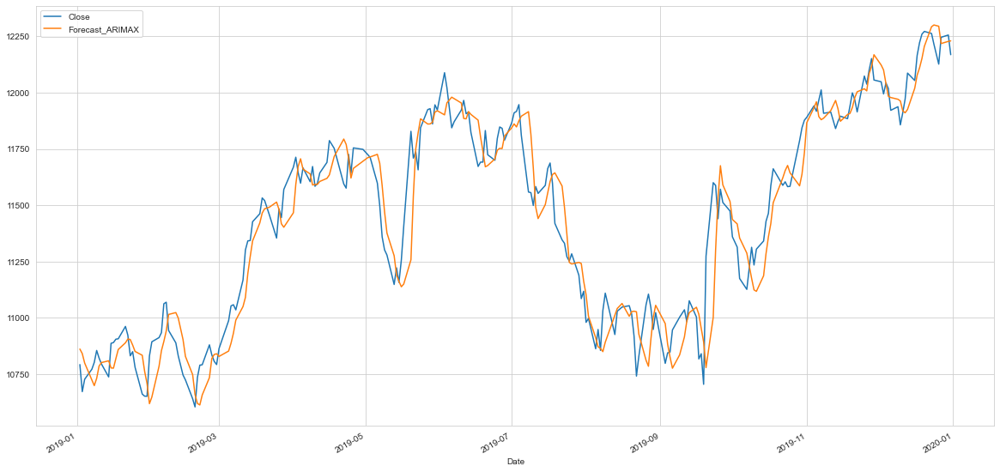

In [24]:
daily_model1 = model(train_before_lockdown, valid_before_lockdown, exogenous_features_with_vlolume, True)
daily_model1.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=33261.497, Time=5.78 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=47732.823, Time=1.67 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=32112.957, Time=3.71 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=33372.328, Time=8.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=32879.569, Time=4.57 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=33142.901, Time=5.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=33181.683, Time=9.79 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=32116.578, Time=9.23 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0]          
Total fit time: 48.409 seconds
train MSE of Auto ARIMAX: 20513.095577125823
train RMSE of Auto ARIMAX: 143.22393507066417
train MAE of Auto ARIMAX: 76.46074796319209
valid MSE of Auto ARIMAX: 18840.433299292246
valid RMSE of Auto ARIMAX: 137.26045788679363
valid MAE of Auto ARIMAX: 104.49209918083406


C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2438
Model:               SARIMAX(1, 0, 0)   Log Likelihood              -16032.478
Date:                Mon, 29 Nov 2021   AIC                          32112.957
Time:                        01:18:43   BIC                          32252.131
Sample:                             0   HQIC                         32163.548
                               - 2438                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
High_mean_lag3        0.3890      0.117      3.321      0.001       0.159       0.619
High_mean_lag7        0.1092      0.196      0.557      0.578      -0.275       0.494
High_mean_lag30      -0.0664      0.179     -0.371      0.711      -0.417       0.284
High_std_lag3         0.4063      0.079      5.169      0.000       0.252       0.560
High_std_lag7         0.2606      0.135      1.927      0.054      -0.004       0.526
High_std_lag30        0.1241      0.220      0.564      0.573      -0.307       0.556
Low_mean_lag3         0.9496      0.108      8.766      0.000       0.737       1.162
Low_mean_lag7        -0.4701      0.190     -2.470      0.014      -0.843      -0.097
Low_mean_lag30        0.0871      0.177      0.491      0.623      -0.260       0.434
Low_std_lag3         -0.0756      0.075     -1.002      0.316      -0.223       0.072
Low_std_lag7         -0.2878      0.131     -2.204      0.028      -0.544      -0.032
Low_std_lag30        -0.1155      0.226     -0.510      0.610      -0.559       0.328
Volume_mean_lag3      0.0002    9.8e-05      1.773      0.076   -1.83e-05       0.000
Volume_mean_lag7     -0.0005      0.000     -3.286      0.001      -0.001      -0.000
Volume_mean_lag30  9.167e-05      0.000      0.798      0.425      -0.000       0.000
Volume_std_lag3    6.781e-05   8.75e-05      0.775      0.439      -0.000       0.000
Volume_std_lag7     8.06e-05      0.000      0.642      0.521      -0.000       0.000
Volume_std_lag30      0.0004      0.000      2.638      0.008       0.000       0.001
Month                 3.8373      6.212      0.618      0.537      -8.338      16.012
Week                 -0.5634      1.444     -0.390      0.696      -3.394       2.267
Day                   0.5640      0.308      1.831      0.067      -0.040       1.168
Day of week          -2.3581      1.219     -1.935      0.053      -4.747       0.031
ar.L1                 0.2652      0.002    124.768      0.000       0.261       0.269
sigma2             7650.5922     23.260    328.912      0.000    7605.003    7696.182
===================================================================================
Ljung-Box (L1) (Q):                   0.34   Jarque-Bera (JB):          68068854.52
Prob(Q):                              0.56   Prob(JB):                         0.00
Heteroskedasticity (H):               0.18   Skew:                           -21.21
Prob(H) (two-sided):                  0.00   Kurtosis:                       820.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

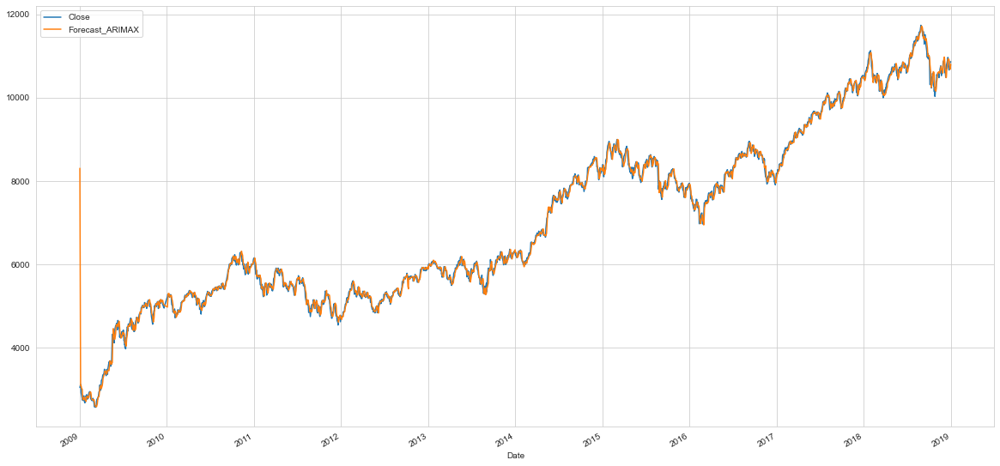

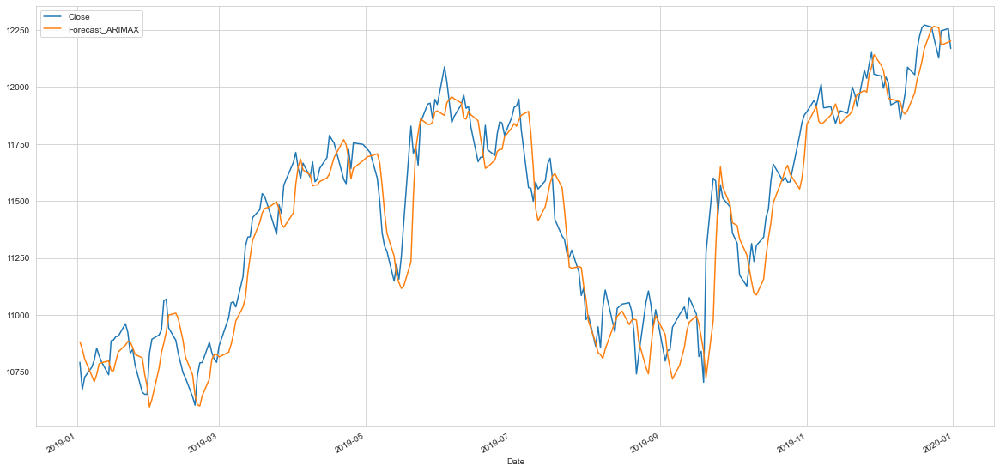

In [25]:
daily_model2 =model(train_before_lockdown, valid_before_lockdown, exogenous_features_with_vlolume, False)
daily_model2.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=29175.673, Time=8.41 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=31151.671, Time=1.15 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=5.16 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=32952.412, Time=5.70 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=31274.232, Time=6.39 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=32756.660, Time=8.26 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=32972.177, Time=6.49 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=27983.054, Time=8.73 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=32778.230, Time=7.94 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=33090.005, Time=8.54 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=27908.998, Time=9.71 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=33081.351, Time=9.36 sec
 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=33219.098, Time=8.99 sec
 ARIMA(3,0,4)(0,0,0)[0] intercept   : AIC=32943.957, Time=10.54 sec
 ARIMA(2,0,4)(0,0,0)[0] 

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2438
Model:               SARIMAX(3, 0, 3)   Log Likelihood              -13930.499
Date:                Mon, 29 Nov 2021   AIC                          27908.998
Time:                        01:21:10   BIC                          28048.172
Sample:                             0   HQIC                         27959.589
                               - 2438                                         
Covariance Type:                  opg                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
intercept           1.6455      5.470      0.301      0.764      -9.076      12.367
High_mean_lag3     -0.1990      0.101     -1.966      0.049      -0.397      -0.001
High_mean_lag7     -0.0016      0.214     -0.008      0.994      -0.421       0.418
High_mean_lag30    -0.3102      0.726     -0.427      0.669      -1.733       1.113
High_std_lag3       0.0723      0.060      1.214      0.225      -0.044       0.189
High_std_lag7      -0.1816      0.122     -1.488      0.137      -0.421       0.058
High_std_lag30      1.0371      0.338      3.066      0.002       0.374       1.700
Low_mean_lag3       0.1551      0.088      1.754      0.079      -0.018       0.328
Low_mean_lag7       0.2390      0.203      1.175      0.240      -0.160       0.638
Low_mean_lag30      0.1018      0.739      0.138      0.890      -1.346       1.549
Low_std_lag3       -0.1538      0.053     -2.905      0.004      -0.258      -0.050
Low_std_lag7        0.0671      0.111      0.603      0.547      -0.151       0.285
Low_std_lag30       1.1784      0.304      3.876      0.000       0.583       1.774
Month               3.4394      1.932      1.780      0.075      -0.348       7.227
Week               -0.0961      0.496     -0.194      0.846      -1.069       0.876
Day                 0.4171      0.216      1.932      0.053      -0.006       0.840
Day of week        -2.7758      0.687     -4.041      0.000      -4.122      -1.429
ar.L1               0.2666      0.062      4.321      0.000       0.146       0.388
ar.L2              -0.2058      0.066     -3.100      0.002      -0.336      -0.076
ar.L3               0.9381      0.058     16.129      0.000       0.824       1.052
ma.L1               0.8328      0.065     12.765      0.000       0.705       0.961
ma.L2               0.9967      0.069     14.354      0.000       0.861       1.133
ma.L3               0.0928      0.022      4.224      0.000       0.050       0.136
sigma2           5371.0588    104.360     51.467      0.000    5166.517    5575.601
===================================================================================
Ljung-Box (L1) (Q):                   0.27   Jarque-Bera (JB):              1675.80
Prob(Q):                              0.61   Prob(JB):                         0.00
Heteroskedasticity (H):               1.04   Skew:                             0.08
Prob(H) (two-sided):                  0.57   Kurtosis:                         7.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

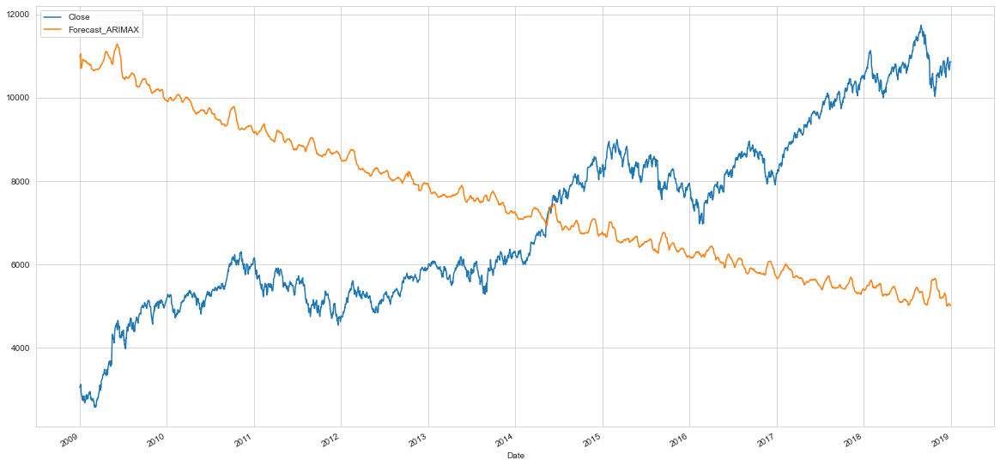

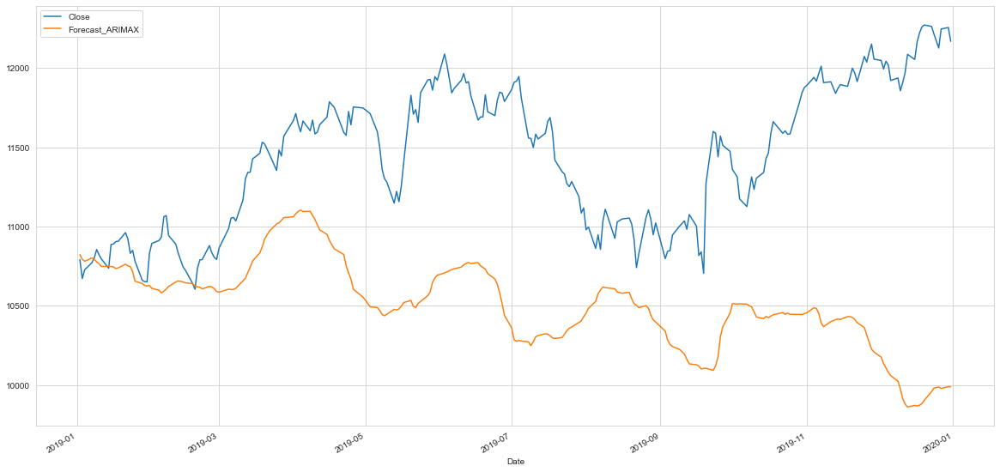

In [26]:
daily_model3 = model(train_before_lockdown, valid_before_lockdown, exogenous_features, True)
daily_model3.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=33041.604, Time=7.57 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=31274.232, Time=6.39 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=4.24 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=32927.457, Time=5.40 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=28054.537, Time=6.33 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=32929.340, Time=6.10 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=32726.950, Time=7.71 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=32659.831, Time=6.72 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=32567.911, Time=6.08 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=28263.504, Time=6.65 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 63.201 seconds
train MSE of Auto ARIMAX: 49186612.12438575
train RMSE of Auto ARIMAX: 7013.316770571949
train MAE of Auto ARIMAX: 6307.980102475584
valid MSE of Auto ARIMAX: 15838188.650889214
valid RMSE of Auto ARIMAX: 3979.72218

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2438
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -14008.268
Date:                Mon, 29 Nov 2021   AIC                          28054.537
Time:                        01:22:20   BIC                          28164.716
Sample:                             0   HQIC                         28094.588
                               - 2438                                         
Covariance Type:                  opg                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
High_mean_lag3     -0.3241      0.108     -3.010      0.003      -0.535      -0.113
High_mean_lag7     -0.5887      0.240     -2.451      0.014      -1.059      -0.118
High_mean_lag30    -0.7329      0.828     -0.885      0.376      -2.357       0.891
High_std_lag3       0.0129      0.063      0.204      0.839      -0.111       0.137
High_std_lag7      -0.6430      0.131     -4.920      0.000      -0.899      -0.387
High_std_lag30      0.4234      0.399      1.060      0.289      -0.359       1.206
Low_mean_lag3       0.3503      0.094      3.724      0.000       0.166       0.535
Low_mean_lag7       0.5640      0.228      2.476      0.013       0.118       1.010
Low_mean_lag30      0.6980      0.838      0.833      0.405      -0.944       2.340
Low_std_lag3        0.2358      0.054      4.345      0.000       0.129       0.342
Low_std_lag7        0.2472      0.119      2.085      0.037       0.015       0.480
Low_std_lag30       0.8934      0.369      2.420      0.016       0.170       1.617
Month               3.5943      2.056      1.749      0.080      -0.435       7.623
Week                0.6424      0.512      1.254      0.210      -0.361       1.646
Day                 0.2223      0.236      0.943      0.346      -0.240       0.685
Day of week        -2.7126      0.764     -3.549      0.000      -4.211      -1.214
ar.L1               0.9973      0.000   4005.506      0.000       0.997       0.998
ma.L1               0.1413      0.020      7.225      0.000       0.103       0.180
sigma2           6114.1686    128.318     47.649      0.000    5862.670    6365.667
===================================================================================
Ljung-Box (L1) (Q):                   4.50   Jarque-Bera (JB):              1343.83
Prob(Q):                              0.03   Prob(JB):                         0.00
Heteroskedasticity (H):               1.09   Skew:                             0.03
Prob(H) (two-sided):                  0.22   Kurtosis:                         6.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

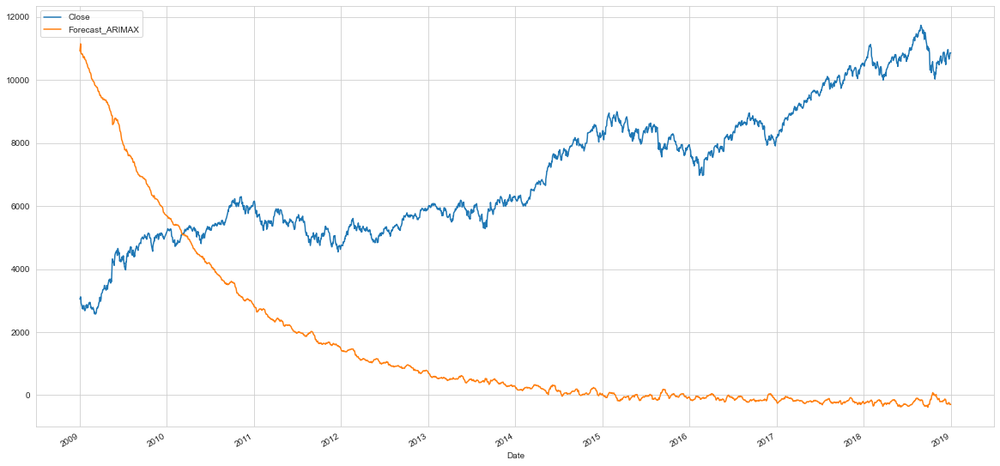

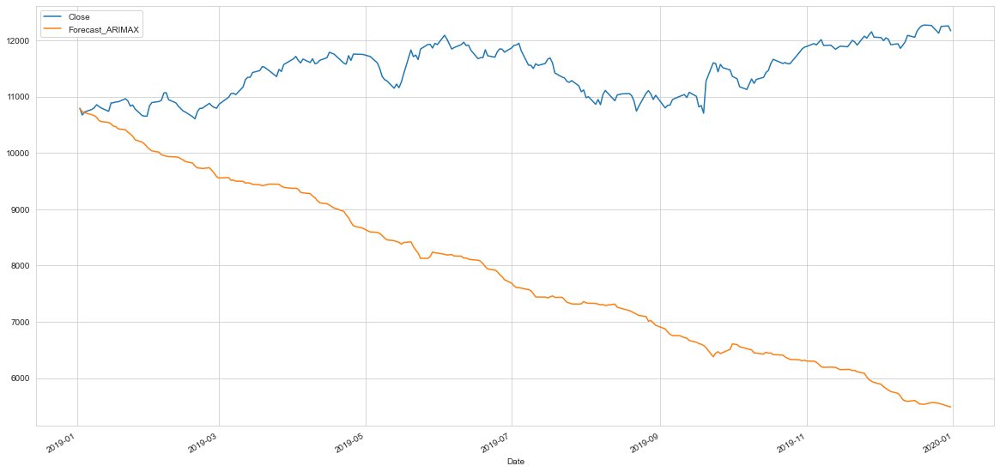

In [27]:
daily_model4 = model(train_before_lockdown, valid_before_lockdown, exogenous_features, False)
daily_model4.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=38255.763, Time=6.60 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=37635.098, Time=2.50 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=37578.143, Time=9.11 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=38322.068, Time=4.61 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=58085.600, Time=1.89 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=38070.435, Time=10.01 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=38214.551, Time=5.14 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=38227.259, Time=5.22 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=37835.823, Time=2.22 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 47.339 seconds
train MSE of Auto ARIMAX: 22805.331683654073
train RMSE of Auto ARIMAX: 151.01434264219432
train MAE of Auto ARIMAX: 87.85162600943255
valid MSE of Auto ARIMAX: 49536.63088393926
valid RMSE of Auto ARIMAX: 222.5682611783164
valid MAE of Auto ARIMAX: 179.2507516866595


C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2929
Model:               SARIMAX(1, 0, 0)   Log Likelihood              -18764.071
Date:                Mon, 29 Nov 2021   AIC                          37578.143
Time:                        01:23:17   BIC                          37727.703
Sample:                             0   HQIC                         37632.005
                               - 2929                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
intercept             1.6658     13.694      0.122      0.903     -25.174      28.506
High_mean_lag3        0.5241      0.095      5.538      0.000       0.339       0.710
High_mean_lag7        0.0443      0.151      0.293      0.770      -0.252       0.341
High_mean_lag30      -0.0513      0.224     -0.229      0.819      -0.490       0.387
High_std_lag3         0.6369      0.055     11.524      0.000       0.529       0.745
High_std_lag7         0.1431      0.121      1.187      0.235      -0.093       0.379
High_std_lag30        0.6008      0.212      2.839      0.005       0.186       1.015
Low_mean_lag3         0.6938      0.088      7.902      0.000       0.522       0.866
Low_mean_lag7        -0.3704      0.143     -2.598      0.009      -0.650      -0.091
Low_mean_lag30        0.1546      0.218      0.708      0.479      -0.273       0.582
Low_std_lag3         -0.2507      0.053     -4.747      0.000      -0.354      -0.147
Low_std_lag7         -0.1669      0.099     -1.678      0.093      -0.362       0.028
Low_std_lag30        -0.5533      0.201     -2.750      0.006      -0.948      -0.159
Volume_mean_lag3  -9.566e-05   5.41e-05     -1.767      0.077      -0.000    1.04e-05
Volume_mean_lag7     -0.0004   9.21e-05     -4.710      0.000      -0.001      -0.000
Volume_mean_lag30     0.0005      0.000      5.240      0.000       0.000       0.001
Volume_std_lag3   -4.984e-05   5.52e-05     -0.903      0.367      -0.000    5.84e-05
Volume_std_lag7       0.0003   8.36e-05      3.453      0.001       0.000       0.000
Volume_std_lag30     -0.0002      0.000     -1.212      0.225      -0.001       0.000
Month                 2.7337      5.956      0.459      0.646      -8.940      14.408
Week                 -0.1224      1.424     -0.086      0.931      -2.913       2.668
Day                   0.2903      0.361      0.805      0.421      -0.417       0.997
Day of week          -1.4185      1.225     -1.158      0.247      -3.820       0.983
ar.L1                 0.6315      0.003    249.358      0.000       0.627       0.636
sigma2             1.032e+04     56.364    183.010      0.000    1.02e+04    1.04e+04
===================================================================================
Ljung-Box (L1) (Q):                 134.23   Jarque-Bera (JB):          22663475.31
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.42   Skew:                            -4.32
Prob(H) (two-sided):                  0.00   Kurtosis:                       433.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

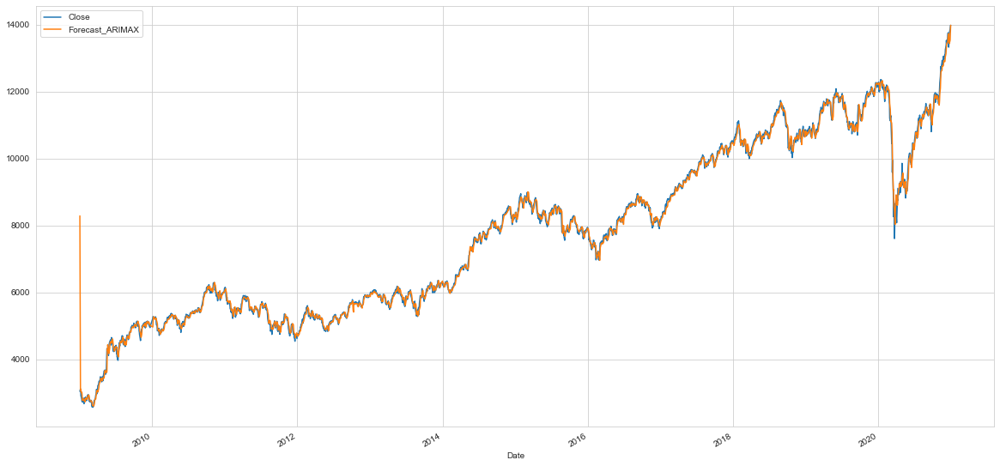

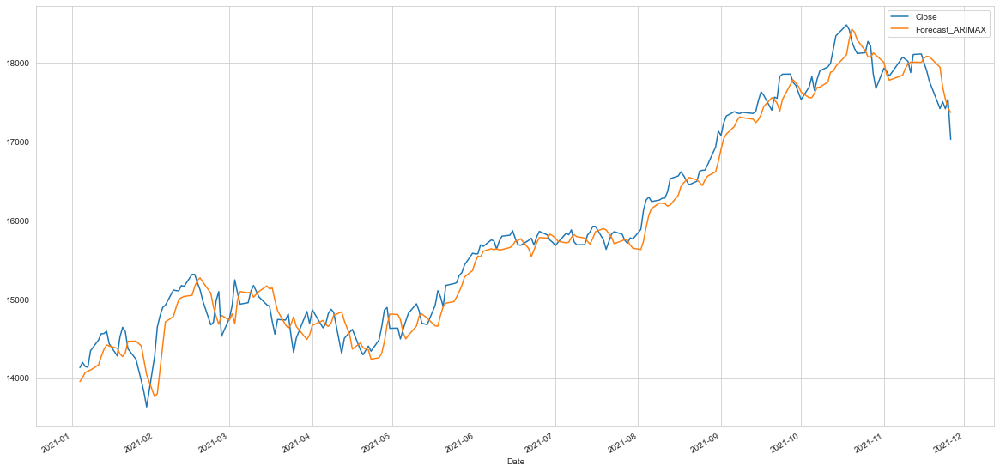

In [28]:
daily_model5 = model(train_including_lockdown, valid_including_lockdown, exogenous_features_with_vlolume, True)
daily_model5.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=38253.753, Time=4.61 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=58085.600, Time=1.88 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=37835.823, Time=2.45 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=38320.301, Time=6.03 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=38068.871, Time=10.18 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=38212.693, Time=4.51 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=38225.447, Time=4.61 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=37578.143, Time=10.09 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=37635.098, Time=4.99 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=38070.435, Time=13.74 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=38214.551, Time=6.02 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=38322.068, Time=4.88 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=38227.259, Time=5.55 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 79.554 seconds


C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



train MSE of Auto ARIMAX: 22805.331683654073
train RMSE of Auto ARIMAX: 151.01434264219432
train MAE of Auto ARIMAX: 87.85162600943255
valid MSE of Auto ARIMAX: 49536.63088393926
valid RMSE of Auto ARIMAX: 222.5682611783164
valid MAE of Auto ARIMAX: 179.2507516866595


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2929
Model:               SARIMAX(1, 0, 0)   Log Likelihood              -18764.071
Date:                Mon, 29 Nov 2021   AIC                          37578.143
Time:                        01:24:47   BIC                          37727.703
Sample:                             0   HQIC                         37632.005
                               - 2929                                         
Covariance Type:                  opg                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
intercept             1.6658     13.694      0.122      0.903     -25.174      28.506
High_mean_lag3        0.5241      0.095      5.538      0.000       0.339       0.710
High_mean_lag7        0.0443      0.151      0.293      0.770      -0.252       0.341
High_mean_lag30      -0.0513      0.224     -0.229      0.819      -0.490       0.387
High_std_lag3         0.6369      0.055     11.524      0.000       0.529       0.745
High_std_lag7         0.1431      0.121      1.187      0.235      -0.093       0.379
High_std_lag30        0.6008      0.212      2.839      0.005       0.186       1.015
Low_mean_lag3         0.6938      0.088      7.902      0.000       0.522       0.866
Low_mean_lag7        -0.3704      0.143     -2.598      0.009      -0.650      -0.091
Low_mean_lag30        0.1546      0.218      0.708      0.479      -0.273       0.582
Low_std_lag3         -0.2507      0.053     -4.747      0.000      -0.354      -0.147
Low_std_lag7         -0.1669      0.099     -1.678      0.093      -0.362       0.028
Low_std_lag30        -0.5533      0.201     -2.750      0.006      -0.948      -0.159
Volume_mean_lag3  -9.566e-05   5.41e-05     -1.767      0.077      -0.000    1.04e-05
Volume_mean_lag7     -0.0004   9.21e-05     -4.710      0.000      -0.001      -0.000
Volume_mean_lag30     0.0005      0.000      5.240      0.000       0.000       0.001
Volume_std_lag3   -4.984e-05   5.52e-05     -0.903      0.367      -0.000    5.84e-05
Volume_std_lag7       0.0003   8.36e-05      3.453      0.001       0.000       0.000
Volume_std_lag30     -0.0002      0.000     -1.212      0.225      -0.001       0.000
Month                 2.7337      5.956      0.459      0.646      -8.940      14.408
Week                 -0.1224      1.424     -0.086      0.931      -2.913       2.668
Day                   0.2903      0.361      0.805      0.421      -0.417       0.997
Day of week          -1.4185      1.225     -1.158      0.247      -3.820       0.983
ar.L1                 0.6315      0.003    249.358      0.000       0.627       0.636
sigma2             1.032e+04     56.364    183.010      0.000    1.02e+04    1.04e+04
===================================================================================
Ljung-Box (L1) (Q):                 134.23   Jarque-Bera (JB):          22663475.31
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.42   Skew:                            -4.32
Prob(H) (two-sided):                  0.00   Kurtosis:                       433.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

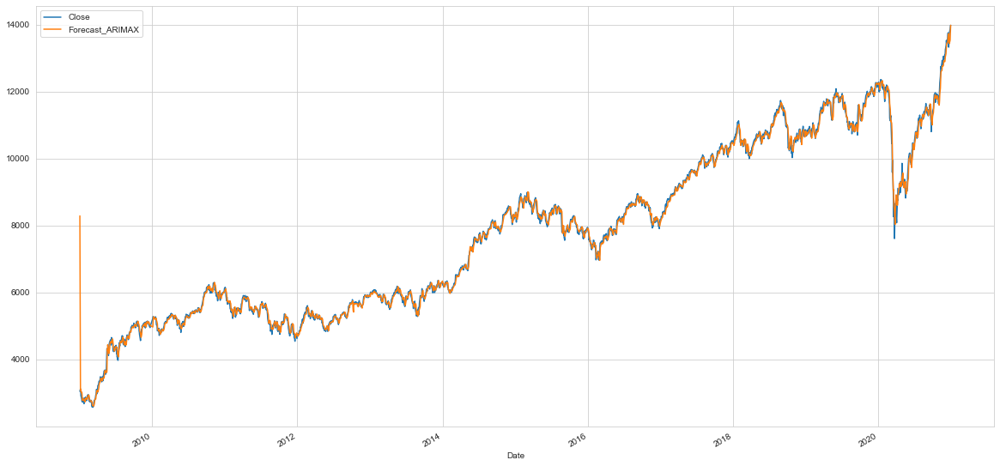

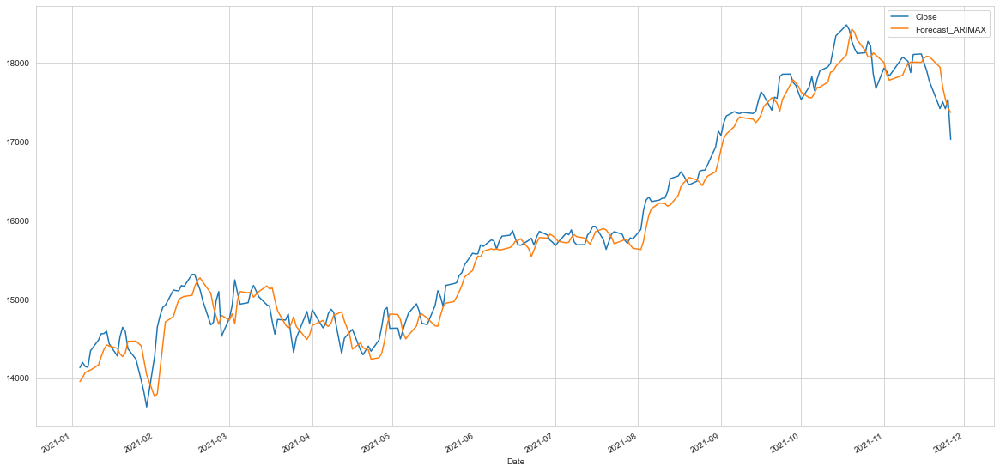

In [29]:
daily_model6 = model(train_including_lockdown, valid_including_lockdown, exogenous_features_with_vlolume, False)
daily_model6.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=38133.749, Time=8.95 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=37667.920, Time=1.16 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=6.05 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=38116.824, Time=6.98 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=39400.516, Time=8.16 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=35758.810, Time=7.57 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=38068.822, Time=7.68 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=37932.224, Time=9.29 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=37964.851, Time=9.18 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=37841.428, Time=7.31 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=35230.298, Time=7.00 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=38090.586, Time=6.81 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=37131.624, Time=5.26 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=38093.166, Time=7.35 sec
 ARIMA(1,0,2)(0,0,0)[0]  

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2929
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -17596.149
Date:                Mon, 29 Nov 2021   AIC                          35230.298
Time:                        01:27:07   BIC                          35343.964
Sample:                             0   HQIC                         35271.233
                               - 2929                                         
Covariance Type:                  opg                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
High_mean_lag3     -0.3908      0.087     -4.514      0.000      -0.561      -0.221
High_mean_lag7     -2.2508      0.174    -12.943      0.000      -2.592      -1.910
High_mean_lag30     0.7803      0.367      2.129      0.033       0.062       1.499
High_std_lag3       0.2226      0.047      4.734      0.000       0.130       0.315
High_std_lag7      -0.9963      0.110     -9.066      0.000      -1.212      -0.781
High_std_lag30      2.0978      0.284      7.394      0.000       1.542       2.654
Low_mean_lag3       0.1517      0.075      2.024      0.043       0.005       0.299
Low_mean_lag7       2.3431      0.153     15.363      0.000       2.044       2.642
Low_mean_lag30     -0.5129      0.362     -1.417      0.157      -1.222       0.197
Low_std_lag3        0.2050      0.044      4.665      0.000       0.119       0.291
Low_std_lag7        0.7303      0.083      8.812      0.000       0.568       0.893
Low_std_lag30      -0.9582      0.233     -4.117      0.000      -1.414      -0.502
Month               1.5901      2.263      0.703      0.482      -2.846       6.026
Week                2.5738      0.499      5.162      0.000       1.597       3.551
Day                 0.8848      0.240      3.684      0.000       0.414       1.355
Day of week        -1.8016      0.905     -1.990      0.047      -3.576      -0.027
ar.L1               0.9962      0.000   3420.116      0.000       0.996       0.997
ma.L1               0.1082      0.014      7.715      0.000       0.081       0.136
sigma2           9979.9633    150.776     66.191      0.000    9684.448    1.03e+04
===================================================================================
Ljung-Box (L1) (Q):                   6.92   Jarque-Bera (JB):             13697.46
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               2.68   Skew:                            -0.47
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

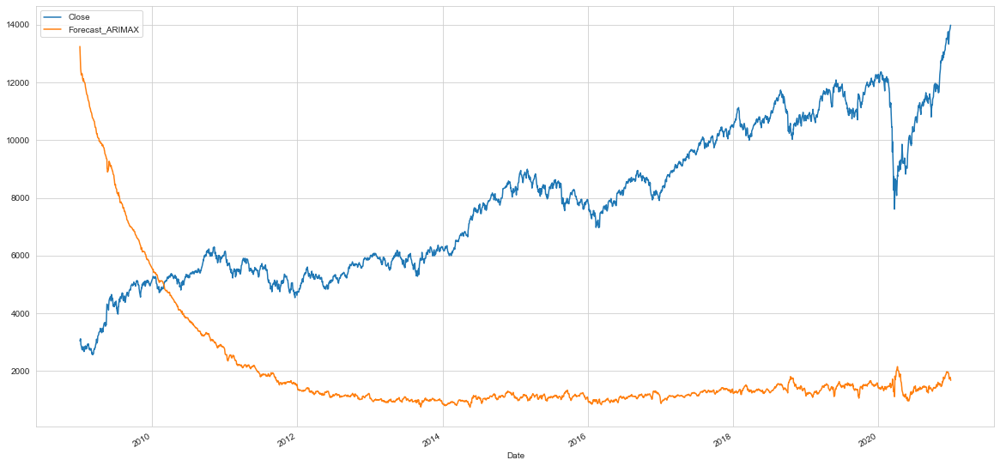

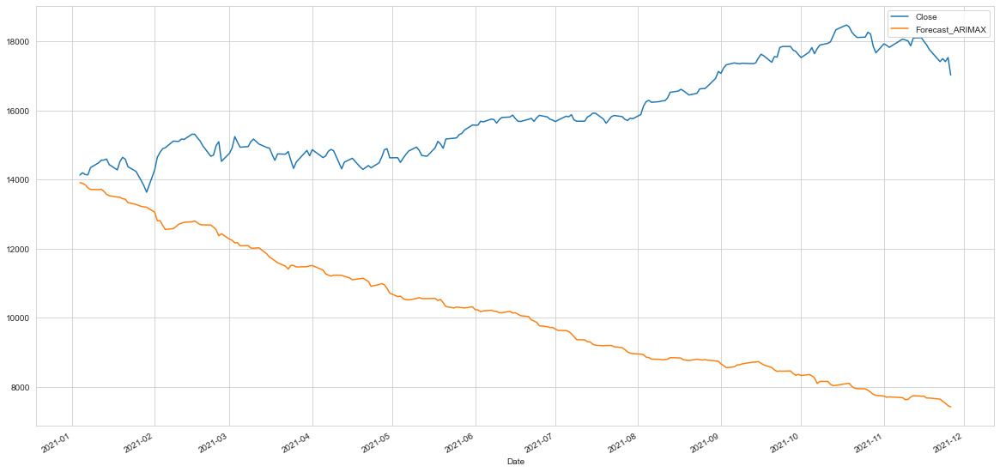

In [30]:
daily_model7 = model(train_including_lockdown, valid_including_lockdown, exogenous_features, True)
daily_model7.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=38004.948, Time=9.19 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=39400.516, Time=8.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=37131.624, Time=5.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=38090.586, Time=6.77 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=37898.218, Time=7.31 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=35230.298, Time=7.11 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=38093.166, Time=7.30 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=37905.399, Time=9.55 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=37954.543, Time=8.29 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=35758.810, Time=7.50 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 76.259 seconds
train MSE of Auto ARIMAX: 48506074.15549524
train RMSE of Auto ARIMAX: 6964.6302238880735
train MAE of Auto ARIMAX: 6384.072437556969
valid MSE of Auto ARIMAX: 41665524.734366834
valid RMSE of Auto ARIMAX: 645

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\basuc\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:390: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2929
Model:               SARIMAX(1, 0, 1)   Log Likelihood              -17596.149
Date:                Mon, 29 Nov 2021   AIC                          35230.298
Time:                        01:28:33   BIC                          35343.964
Sample:                             0   HQIC                         35271.233
                               - 2929                                         
Covariance Type:                  opg                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
High_mean_lag3     -0.3908      0.087     -4.514      0.000      -0.561      -0.221
High_mean_lag7     -2.2508      0.174    -12.943      0.000      -2.592      -1.910
High_mean_lag30     0.7803      0.367      2.129      0.033       0.062       1.499
High_std_lag3       0.2226      0.047      4.734      0.000       0.130       0.315
High_std_lag7      -0.9963      0.110     -9.066      0.000      -1.212      -0.781
High_std_lag30      2.0978      0.284      7.394      0.000       1.542       2.654
Low_mean_lag3       0.1517      0.075      2.024      0.043       0.005       0.299
Low_mean_lag7       2.3431      0.153     15.363      0.000       2.044       2.642
Low_mean_lag30     -0.5129      0.362     -1.417      0.157      -1.222       0.197
Low_std_lag3        0.2050      0.044      4.665      0.000       0.119       0.291
Low_std_lag7        0.7303      0.083      8.812      0.000       0.568       0.893
Low_std_lag30      -0.9582      0.233     -4.117      0.000      -1.414      -0.502
Month               1.5901      2.263      0.703      0.482      -2.846       6.026
Week                2.5738      0.499      5.162      0.000       1.597       3.551
Day                 0.8848      0.240      3.684      0.000       0.414       1.355
Day of week        -1.8016      0.905     -1.990      0.047      -3.576      -0.027
ar.L1               0.9962      0.000   3420.116      0.000       0.996       0.997
ma.L1               0.1082      0.014      7.715      0.000       0.081       0.136
sigma2           9979.9633    150.776     66.191      0.000    9684.448    1.03e+04
===================================================================================
Ljung-Box (L1) (Q):                   6.92   Jarque-Bera (JB):             13697.46
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               2.68   Skew:                            -0.47
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

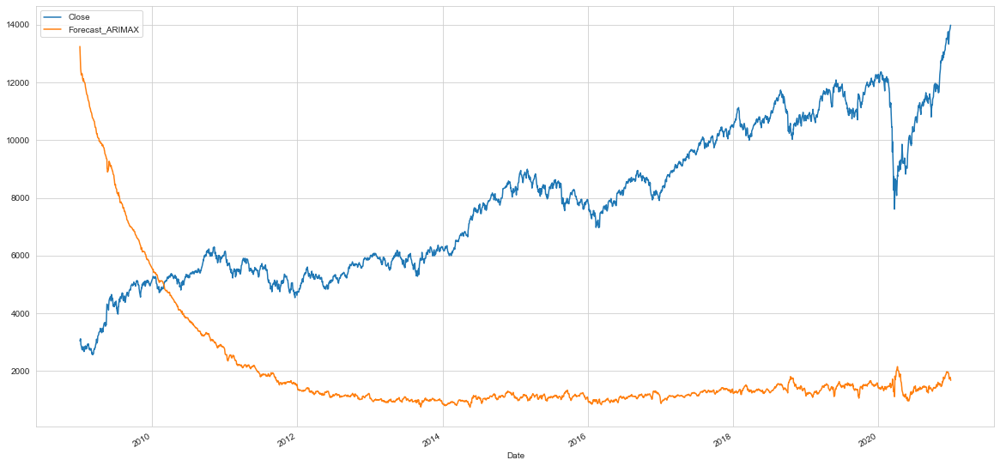

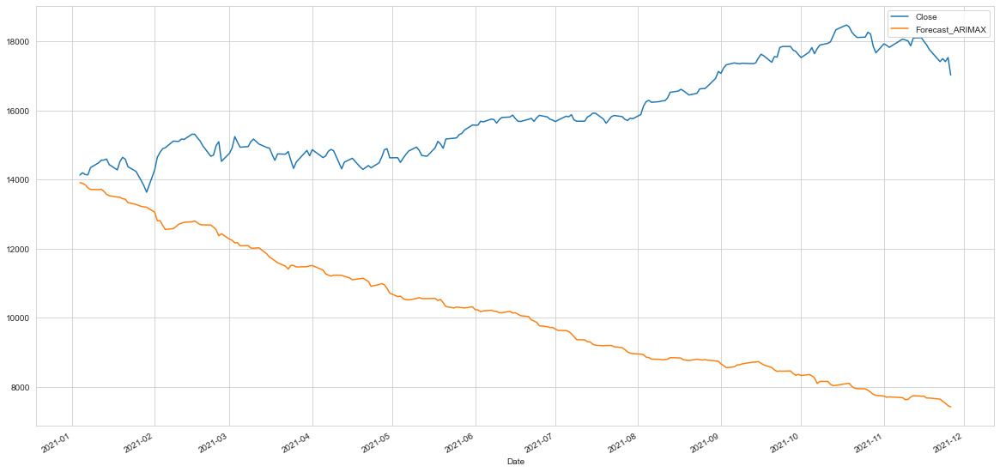

In [31]:
daily_model8 = model(train_including_lockdown, valid_including_lockdown, exogenous_features, False)
daily_model8.summary()

In [32]:
weekly.describe()

,Open,High,Low,Close,Adj Close,Volume
count,675.000000,675.000000,675.000000,675.000000,675.000000,6.750000e+02
mean,8327.411781,8457.274441,8189.562890,8338.057408,8338.057408,9.676104e+05
std,3251.372962,3283.022727,3214.284173,3254.513132,3254.513132,1.022565e+06
min,2574.500000,2663.899902,2539.449951,2573.149902,2573.149902,0.000000e+00
25%,5554.175049,5704.024902,5485.300049,5587.075195,5587.075195,0.000000e+00
50%,8027.700195,8151.250000,7925.149902,8033.299805,8033.299805,7.817000e+05
75%,10599.575195,10756.250000,10433.725098,10599.225098,10599.225098,1.242000e+06
max,18382.699219,18604.449219,18209.349609,18266.599609,18266.599609,6.081400e+06


In [33]:
#Creating a copy
weekly_analysis=weekly.copy()

#Coverting date column to datetime data type
weekly_analysis['Date'] = weekly_analysis['Date'].apply(pd.to_datetime)

#Extracting Month, Week, Day,Day of week
weekly_analysis["Month"] = weekly_analysis.Date.dt.month
weekly_analysis["Week"] = weekly_analysis.Date.dt.week

#Setting date column as index
weekly_analysis.set_index("Date", drop=False, inplace=True)
weekly_analysis.iloc[:,15:19].head()
#Imputing null values with mean 
weekly_analysis.fillna(weekly_analysis.mean(),inplace=True)

#Checking for null values
weekly_analysis.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Month        0
Week         0
dtype: int64

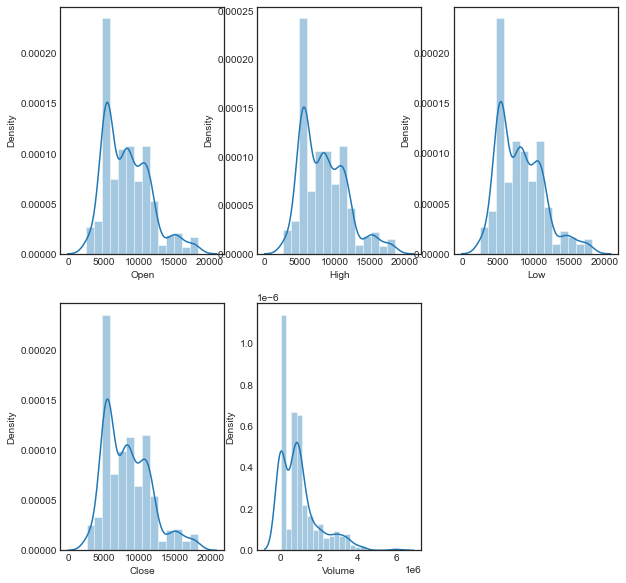

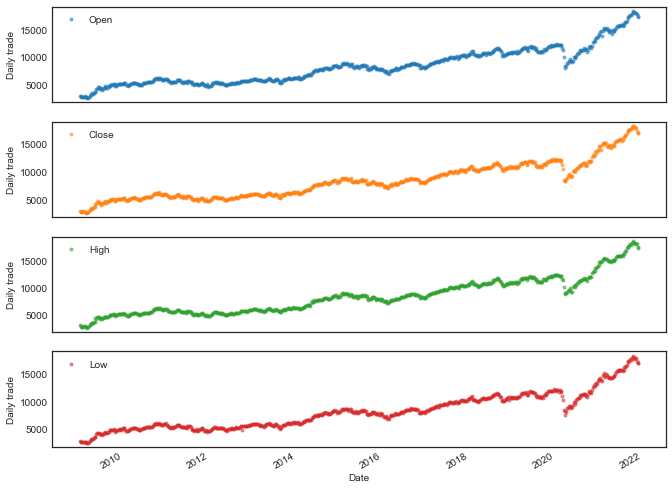

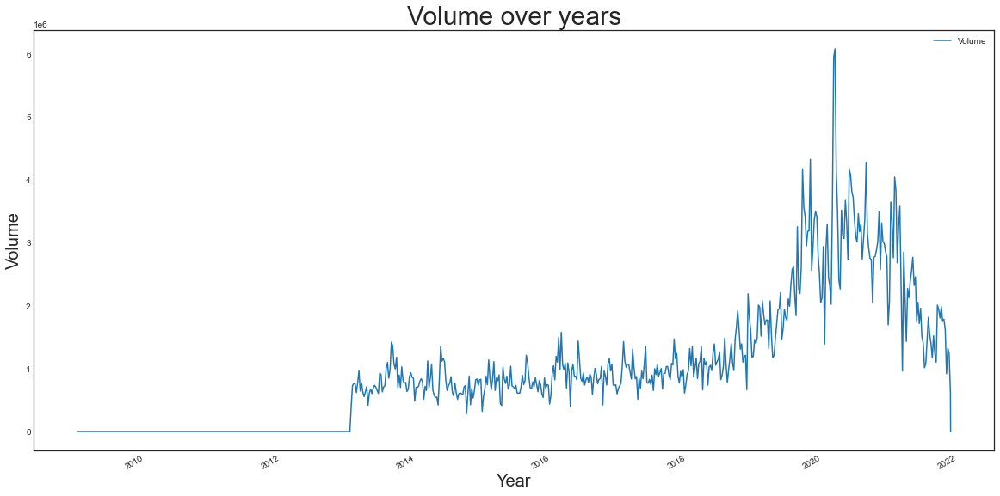

In [34]:
plot_prices(weekly_analysis)

In [35]:
compare_prices(weekly_analysis, 'Open', 'Close')
compare_prices(weekly_analysis, 'High', 'Low')

In [36]:
#Making a copy
weekly_lag=weekly_analysis.copy()
#Reset index
weekly_lag.reset_index(drop=True, inplace=True)
#Creating lag features
lag_features = ["High", "Low", "Volume"]

# Taking the number of days in window
window4 = 4

#Rolling mean
df_rolled_4w = weekly_lag[lag_features].rolling(window=window4, min_periods=0)

#Moving average
df_mean_4w = df_rolled_4w.mean().shift(1).reset_index().astype(np.float32)

#Standard deviation
df_std_4w = df_rolled_4w.std().shift(1).reset_index().astype(np.float32)

# Adding the features to the dataframe
for feature in lag_features:
    weekly_lag[f"{feature}_mean_lag{window4}"] = df_mean_4w[feature]    
    weekly_lag[f"{feature}_std_lag{window4}"] = df_std_4w[feature]

weekly_lag.fillna(weekly_lag.mean(), inplace=True)

#Setting Date as index
weekly_lag.set_index("Date", drop=False, inplace=True)
weekly_lag.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Week,High_mean_lag4,High_std_lag4,Low_mean_lag4,Low_std_lag4,Volume_mean_lag4,Volume_std_lag4
Date,,,,,,,,,,,,,,,
2009-01-01,2009-01-01,2963.300049,3147.199951,2888.199951,2920.399902,2920.399902,0,1,1,8411.324219,128.457336,8144.559570,153.621140,966952.375,179451.84375
2009-01-08,2009-01-08,2919.949951,2929.850098,2720.800049,2835.300049,2835.300049,0,1,2,3147.199951,128.457336,2888.199951,153.621140,0.000,179451.84375
2009-01-15,2009-01-15,2832.300049,2868.199951,2690.199951,2706.149902,2706.149902,0,1,3,3038.525146,153.689560,2804.500000,118.369606,0.000,0.00000
2009-01-22,2009-01-22,2714.699951,2855.399902,2661.649902,2849.500000,2849.500000,0,1,4,2981.750000,146.562103,2766.399902,106.585716,0.000,0.00000
2009-01-29,2009-01-29,2849.350098,2881.000000,2752.899902,2803.050049,2803.050049,0,1,5,2950.162354,135.319580,2740.212402,101.571754,0.000,0.00000


In [37]:
#Printing the high curve
fig = go.Figure()
fig.add_trace(go.Scatter(
         x=weekly_lag['Date'],
         y=weekly_lag['High'],
         name='High',
    line=dict(color='green'),
    opacity=0.8))

#Printing the low curve
fig.add_trace(go.Scatter(
         x=weekly_lag['Date'],
         y=weekly_lag['Low'],
         name='Low',
    line=dict(color='orange'),
    opacity=0.8))

#Printing the high lag mean-30 days curve
fig.add_trace(go.Scatter(
         x=weekly_lag['Date'],
         y=weekly_lag['High_mean_lag4'],
         name='High_mean_lag30',
    line=dict(color='red'),
    opacity=0.8))

#Printing the high lag standard deviation-30 days curve
fig.add_trace(go.Scatter(
         x=weekly_lag['Date'],
         y=weekly_lag['High_std_lag4'],
         name='High_std_lag30',
    line=dict(color='royalblue'),
    opacity=0.8))

#Printing the low lag mean-30 days curve
fig.add_trace(go.Scatter(
         x=weekly_lag['Date'],
         y=weekly_lag['Low_mean_lag4'],
         name='Low_mean_lag30',
    line=dict(color='yellow'),
    opacity=0.8))

#Printing the low lag standard deviation-30 days curve
fig.add_trace(go.Scatter(
         x=weekly_lag['Date'],
         y=weekly_lag['Low_std_lag4'],
         name='Low_std_lag30',
    line=dict(color='pink'),
    opacity=0.8))

#Updating the time axis
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
        
#Update the title   
fig.update_layout(title_text='High Vs Low with mean lag and standard deviation lag',plot_bgcolor='rgb(248, 248, 255)',yaxis_title='Value')

fig.show()

In [38]:
train_before_lockdown = weekly_lag[weekly_lag.Date < "2019"]
valid_before_lockdown = weekly_lag[weekly_lag.Date >= "2019"][weekly_lag.Date < "2020"]
train_including_lockdown = weekly_lag[weekly_lag.Date < "2021"]
valid_including_lockdown = weekly_lag[weekly_lag.Date >= "2021"]

In [39]:
exogenous_features_with_vlolume = ['High_mean_lag4','High_std_lag4', 'Low_mean_lag4',
       'Low_std_lag4', 'Volume_mean_lag4', 'Volume_std_lag4', 'Month', 'Week']
exogenous_features = ['High_mean_lag4','High_std_lag4', 'Low_mean_lag4',
       'Low_std_lag4', 'Month', 'Week']

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=9122.778, Time=1.67 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=9153.894, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=9121.338, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=12564.567, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=9115.950, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=9765.477, Time=1.01 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=9099.278, Time=1.08 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=9081.413, Time=1.41 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=9126.589, Time=0.80 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=9103.612, Time=1.45 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=9094.813, Time=0.67 sec

Best model:  ARIMA(0,0,2)(0,0,0)[0] intercept
Total fit time: 11.292 seconds
train MSE of Auto ARIMAX: 139286.3165660319
train RMSE of Auto ARIMAX: 373.2108205371756
tr

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  627
Model:               SARIMAX(0, 0, 2)   Log Likelihood               -4528.707
Date:                Mon, 29 Nov 2021   AIC                           9081.413
Time:                        01:28:48   BIC                           9134.705
Sample:                    01-01-2009   HQIC                          9102.117
                         - 12-31-2020                                         
Covariance Type:                  opg                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept            7.0829     62.848      0.113      0.910    -116.096     130.262
High_mean_lag4       0.7510      0.165      4.548      0.000       0.427       1.075
High_std_lag4        0.9184      0.138      6.666      0.000       0.648       1.188
Low_mean_lag4        0.2417      0.162      1.494      0.135      -0.075       0.559
Low_std_lag4        -0.7623      0.107     -7.110      0.000      -0.972      -0.552
Volume_mean_lag4   5.01e-05   3.41e-05      1.471      0.141   -1.66e-05       0.000
Volume_std_lag4     -0.0005   3.83e-05    -12.454      0.000      -0.001      -0.000
Month              -32.2522     26.270     -1.228      0.220     -83.741      19.237
Week                 9.7476      5.958      1.636      0.102      -1.930      21.426
ma.L1                0.7162      0.007    105.476      0.000       0.703       0.729
ma.L2                0.4173      0.012     33.782      0.000       0.393       0.441
sigma2            4.495e+04      3.475   1.29e+04      0.000    4.49e+04     4.5e+04
===================================================================================
Ljung-Box (L1) (Q):                  28.92   Jarque-Bera (JB):            162648.01
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.43   Skew:                            -3.19
Prob(H) (two-sided):                  0.00   Kurtosis:                        81.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 9.72e+19. Standard errors may be unstable.
"""

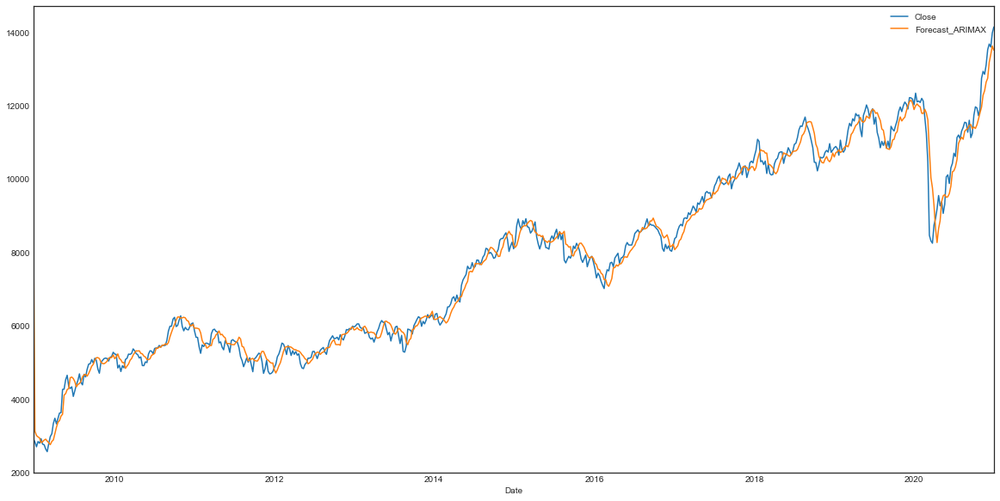

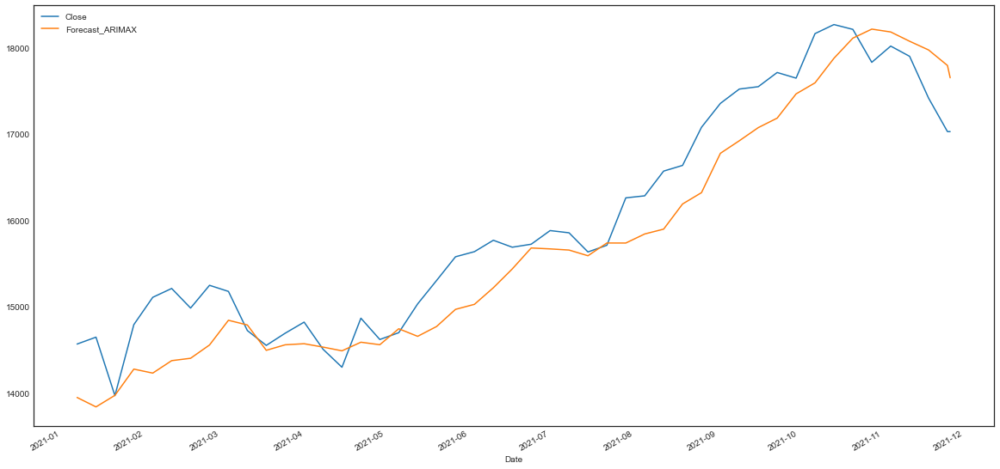

In [40]:
weekmodel1 = model(train_including_lockdown, valid_including_lockdown, exogenous_features_with_vlolume, True)
weekmodel1.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=9125.661, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=12564.567, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=1.01 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9118.357, Time=1.42 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9115.703, Time=1.28 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9762.949, Time=0.65 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=9071.972, Time=1.91 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=9094.813, Time=0.82 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=9101.959, Time=1.84 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=9124.675, Time=1.20 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=9121.502, Time=1.97 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=9099.278, Time=1.09 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0]          
Total fit time: 14.418 seconds
train MSE of Auto ARIMAX: 162852.64948127576
train RMSE of Auto ARIMAX: 403.5500582099769
t

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  627
Model:               SARIMAX(1, 0, 2)   Log Likelihood               -4523.986
Date:                Mon, 29 Nov 2021   AIC                           9071.972
Time:                        01:29:05   BIC                           9125.264
Sample:                    01-01-2009   HQIC                          9092.676
                         - 12-31-2020                                         
Covariance Type:                  opg                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
High_mean_lag4       0.8546      0.171      5.007      0.000       0.520       1.189
High_std_lag4        0.8258      0.118      7.016      0.000       0.595       1.057
Low_mean_lag4        0.1338      0.171      0.781      0.435      -0.202       0.470
Low_std_lag4        -0.4288      0.090     -4.785      0.000      -0.604      -0.253
Volume_mean_lag4 -4.258e-05   3.61e-05     -1.179      0.238      -0.000    2.82e-05
Volume_std_lag4     -0.0004   4.82e-05     -7.842      0.000      -0.000      -0.000
Month              -32.2488     20.862     -1.546      0.122     -73.137       8.640
Week                 9.7590      4.795      2.035      0.042       0.361      19.157
ar.L1                0.6373      0.017     38.321      0.000       0.605       0.670
ma.L1                0.1854      0.022      8.560      0.000       0.143       0.228
ma.L2                0.1682      0.022      7.607      0.000       0.125       0.212
sigma2            4.119e+04      0.103   3.98e+05      0.000    4.12e+04    4.12e+04
===================================================================================
Ljung-Box (L1) (Q):                  40.26   Jarque-Bera (JB):            171147.96
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.45   Skew:                             0.94
Prob(H) (two-sided):                  0.00   Kurtosis:                        83.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.69e+21. Standard errors may be unstable.
"""

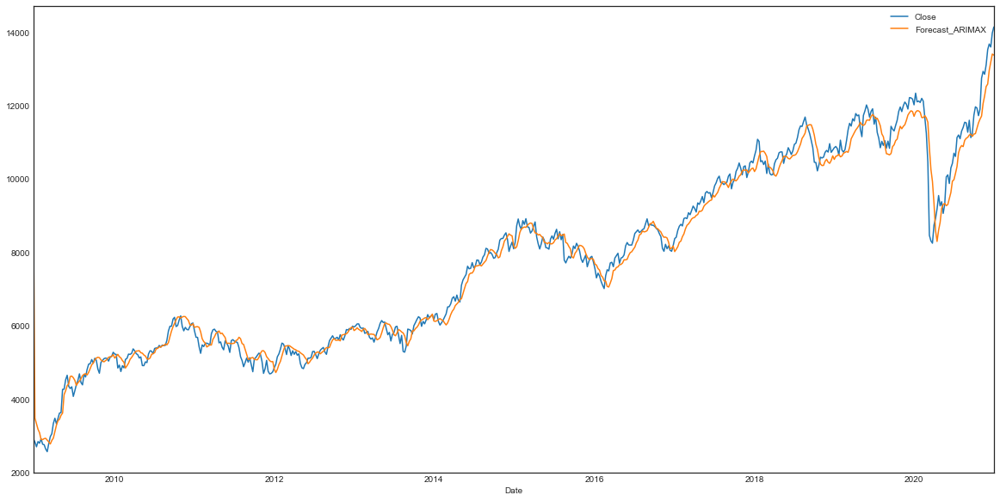

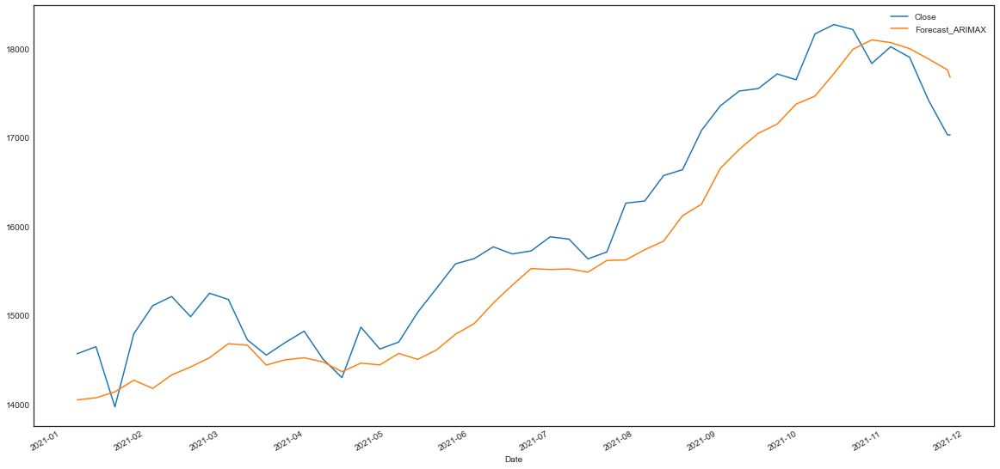

In [41]:
weekmodel2 = model(train_including_lockdown, valid_including_lockdown, exogenous_features_with_vlolume, False)
weekmodel2.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=8495.046, Time=2.26 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=9192.504, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=9067.741, Time=1.17 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=9192.113, Time=0.97 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=8427.802, Time=1.72 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=9021.311, Time=1.64 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=8430.830, Time=1.37 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=9009.056, Time=1.94 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=9028.381, Time=1.28 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=8421.212, Time=1.43 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=8902.139, Time=2.45 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=8972.865, Time=1.69 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=8

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  627
Model:               SARIMAX(3, 0, 2)   Log Likelihood               -4196.719
Date:                Mon, 29 Nov 2021   AIC                           8417.438
Time:                        01:29:48   BIC                           8470.729
Sample:                    01-01-2009   HQIC                          8438.142
                         - 12-31-2020                                         
Covariance Type:                  opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
High_mean_lag4    -0.3979      0.248     -1.603      0.109      -0.884       0.089
High_std_lag4     -0.0582      0.167     -0.348      0.727      -0.385       0.269
Low_mean_lag4      0.4283      0.211      2.033      0.042       0.015       0.841
Low_std_lag4      -0.2415      0.141     -1.708      0.088      -0.518       0.036
Month            -57.2482     21.697     -2.639      0.008     -99.773     -14.723
Week              13.1266      5.021      2.614      0.009       3.286      22.967
ar.L1             -0.6432      0.195     -3.297      0.001      -1.026      -0.261
ar.L2              0.9200      0.040     22.717      0.000       0.841       0.999
ar.L3              0.7226      0.189      3.813      0.000       0.351       1.094
ma.L1              1.7024      0.169     10.101      0.000       1.372       2.033
ma.L2              0.7962      0.161      4.932      0.000       0.480       1.113
sigma2          4.394e+04   2008.553     21.878      0.000       4e+04    4.79e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):              4048.25
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               2.73   Skew:                            -1.25
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

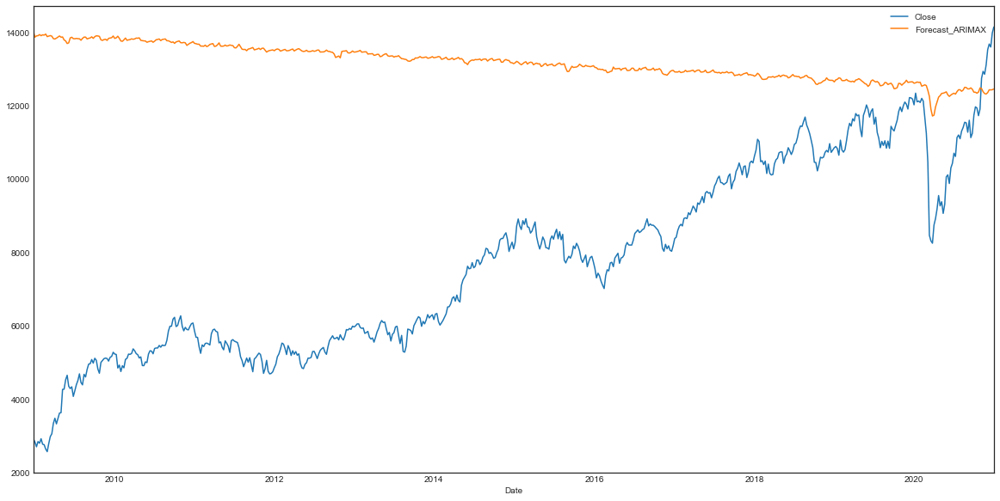

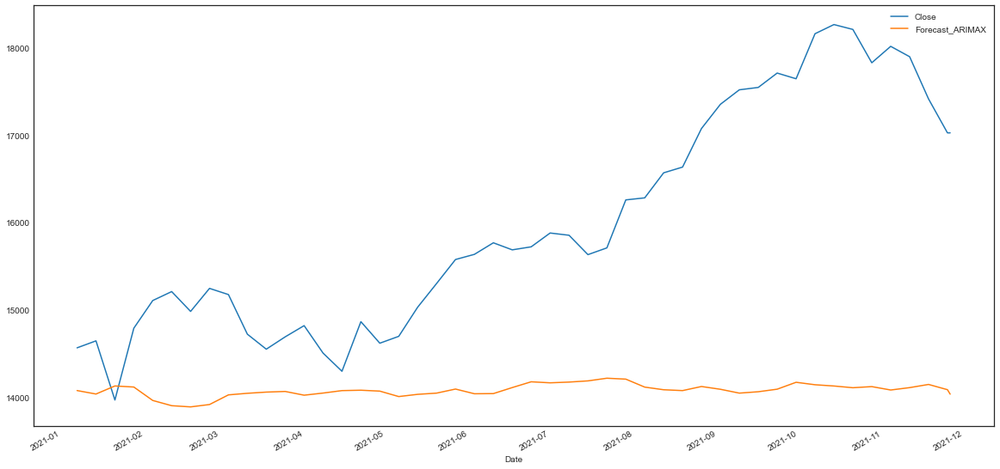

In [42]:
weekmodel3 = model(train_including_lockdown, valid_including_lockdown, exogenous_features, True)
weekmodel3.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=8965.673, Time=1.25 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=9192.113, Time=0.78 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.61 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=9066.054, Time=0.71 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=8473.857, Time=1.09 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=9019.194, Time=1.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=8431.448, Time=1.00 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8418.148, Time=0.94 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.87 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=8433.291, Time=1.17 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=9009.404, Time=0.99 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=8417.438, Time=1.19 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=8417.725, Time=1.23 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=inf, Time=1.31 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=8425.3

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  627
Model:               SARIMAX(3, 0, 2)   Log Likelihood               -4196.719
Date:                Mon, 29 Nov 2021   AIC                           8417.438
Time:                        01:30:09   BIC                           8470.729
Sample:                    01-01-2009   HQIC                          8438.142
                         - 12-31-2020                                         
Covariance Type:                  opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
High_mean_lag4    -0.3979      0.248     -1.603      0.109      -0.884       0.089
High_std_lag4     -0.0582      0.167     -0.348      0.727      -0.385       0.269
Low_mean_lag4      0.4283      0.211      2.033      0.042       0.015       0.841
Low_std_lag4      -0.2415      0.141     -1.708      0.088      -0.518       0.036
Month            -57.2482     21.697     -2.639      0.008     -99.773     -14.723
Week              13.1266      5.021      2.614      0.009       3.286      22.967
ar.L1             -0.6432      0.195     -3.297      0.001      -1.026      -0.261
ar.L2              0.9200      0.040     22.717      0.000       0.841       0.999
ar.L3              0.7226      0.189      3.813      0.000       0.351       1.094
ma.L1              1.7024      0.169     10.101      0.000       1.372       2.033
ma.L2              0.7962      0.161      4.932      0.000       0.480       1.113
sigma2          4.394e+04   2008.553     21.878      0.000       4e+04    4.79e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):              4048.25
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               2.73   Skew:                            -1.25
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

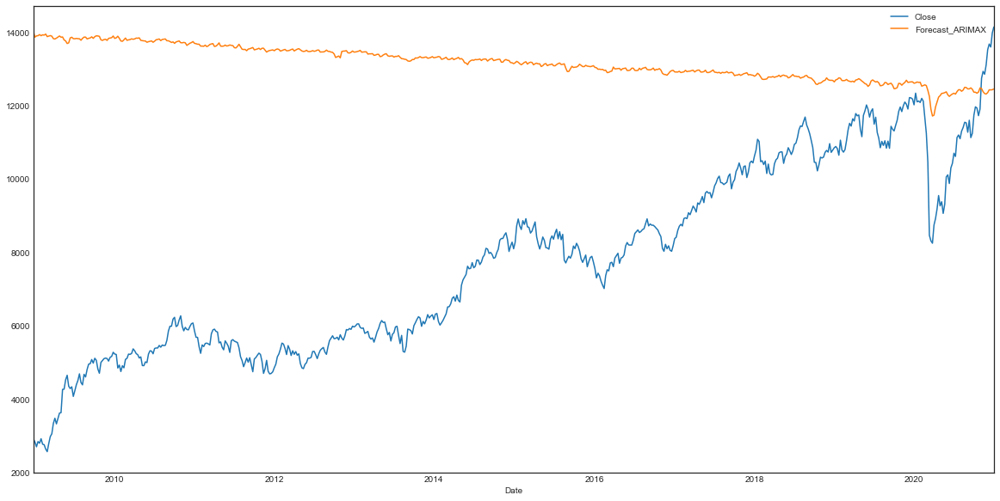

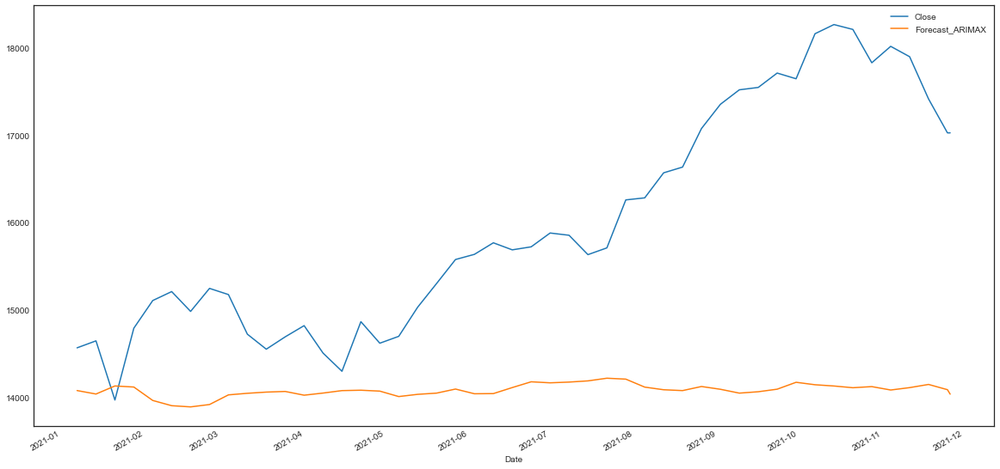

In [43]:
weekmodel4 = model(train_including_lockdown, valid_including_lockdown, exogenous_features, False)
weekmodel4.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=6773.372, Time=1.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=7534.350, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=7683.804, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=7533.902, Time=0.60 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=6772.420, Time=0.91 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=7707.522, Time=0.84 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=6771.756, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=6767.233, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=6773.401, Time=1.09 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.72 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit t

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  522
Model:               SARIMAX(2, 0, 1)   Log Likelihood               -3372.616
Date:                Mon, 29 Nov 2021   AIC                           6767.233
Time:                        01:30:22   BIC                           6814.067
Sample:                    01-01-2009   HQIC                          6785.576
                         - 12-27-2018                                         
Covariance Type:                  opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
intercept          7.7118     46.129      0.167      0.867     -82.699      98.122
High_mean_lag4    -0.0791      0.251     -0.315      0.753      -0.572       0.414
High_std_lag4     -0.1238      0.155     -0.796      0.426      -0.429       0.181
Low_mean_lag4      0.0907      0.234      0.388      0.698      -0.368       0.549
Low_std_lag4       0.2164      0.136      1.588      0.112      -0.051       0.483
Month             -7.0253     15.976     -0.440      0.660     -38.337      24.287
Week               2.4758      3.599      0.688      0.492      -4.579       9.530
ar.L1              0.0381      0.145      0.264      0.792      -0.245       0.322
ar.L2              0.9607      0.144      6.669      0.000       0.678       1.243
ma.L1              0.9677      0.134      7.243      0.000       0.706       1.230
sigma2           2.36e+04   1285.624     18.358      0.000    2.11e+04    2.61e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.14   Jarque-Bera (JB):                51.41
Prob(Q):                              0.71   Prob(JB):                         0.00
Heteroskedasticity (H):               1.06   Skew:                            -0.37
Prob(H) (two-sided):                  0.68   Kurtosis:                         4.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

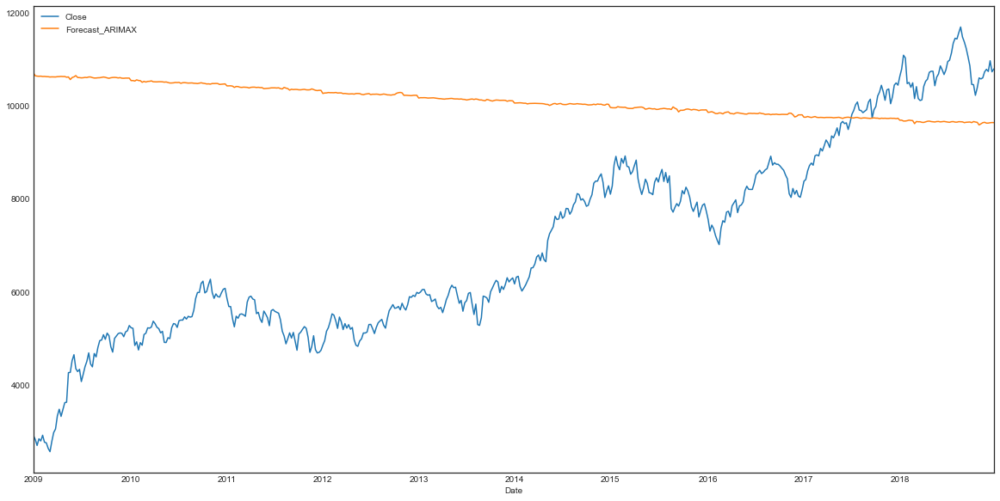

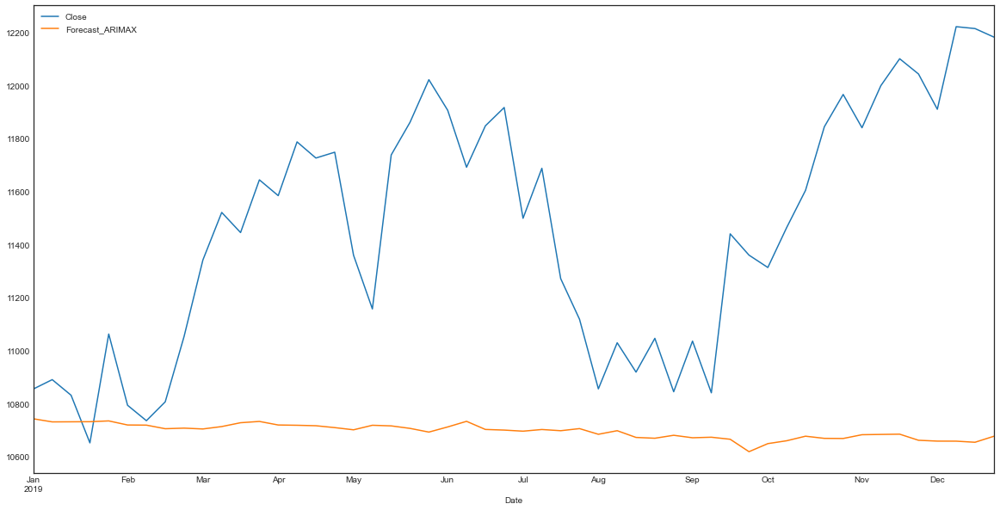

In [44]:
weekmodel5 = model(train_before_lockdown, valid_before_lockdown, exogenous_features, True)
weekmodel5.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=6775.675, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=7533.902, Time=0.61 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.53 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=7680.387, Time=0.62 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=6775.887, Time=0.85 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.72 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=0.92 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=6775.252, Time=0.96 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=6777.323, Time=0.98 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=6771.764, Time=1.08 sec
 ARIMA(4,0,3)(0,0,0)[0]             : AIC=6772.364, Time=1.19 sec
 ARIMA(3,0,4)(0,0,0)[0]             : AIC=6781.008, Time=1.29 sec
 ARIMA(2,0,4)(0,0,0)[0]             : AIC=6780.021, Time=1.11 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=6774.200, Time=1.04 sec
 ARIMA(4,0,4)(0,0,0)[0]             : AIC=6781.8

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  522
Model:               SARIMAX(3, 0, 3)   Log Likelihood               -3372.882
Date:                Mon, 29 Nov 2021   AIC                           6771.764
Time:                        01:30:39   BIC                           6827.114
Sample:                    01-01-2009   HQIC                          6793.443
                         - 12-27-2018                                         
Covariance Type:                  opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
High_mean_lag4    -0.0928      0.255     -0.364      0.716      -0.592       0.407
High_std_lag4     -0.1600      0.165     -0.973      0.331      -0.483       0.163
Low_mean_lag4      0.0993      0.249      0.398      0.690      -0.389       0.588
Low_std_lag4       0.2385      0.145      1.641      0.101      -0.046       0.523
Month             -7.4197     16.492     -0.450      0.653     -39.743      24.904
Week               2.2363      3.739      0.598      0.550      -5.092       9.564
ar.L1             -0.4148      0.511     -0.811      0.417      -1.417       0.588
ar.L2              0.9356      0.090     10.373      0.000       0.759       1.112
ar.L3              0.4790      0.511      0.937      0.349      -0.523       1.481
ma.L1              1.4490      0.514      2.821      0.005       0.442       2.456
ma.L2              0.4761      0.565      0.842      0.400      -0.632       1.584
ma.L3             -0.0439      0.072     -0.611      0.541      -0.185       0.097
sigma2          2.442e+04   1300.123     18.781      0.000    2.19e+04     2.7e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                54.08
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               1.09   Skew:                            -0.38
Prob(H) (two-sided):                  0.56   Kurtosis:                         4.38
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

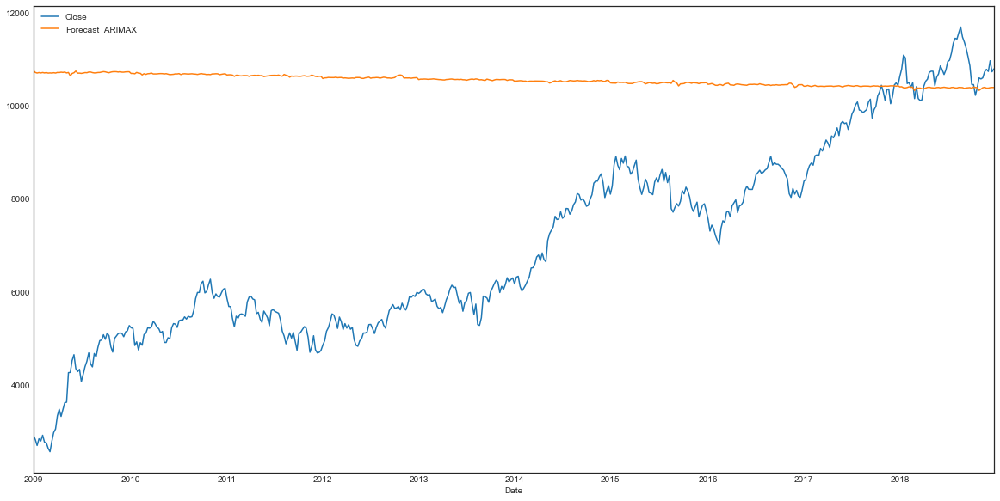

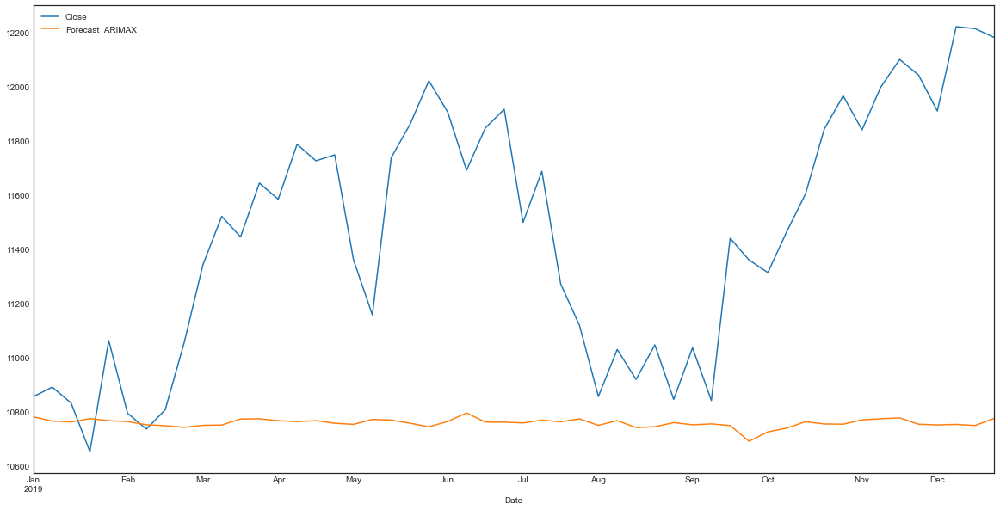

In [45]:
weekmodel6 = model(train_before_lockdown, valid_before_lockdown, exogenous_features, False)
weekmodel6.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=7777.434, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=7536.492, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=7712.448, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10280.157, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=7078.556, Time=0.89 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=8325.851, Time=0.80 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=7777.087, Time=0.91 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=7751.209, Time=0.66 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=7041.133, Time=0.82 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=7708.254, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.63 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8322.378, Time=0.31 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=7775.

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  522
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -3509.566
Date:                Mon, 29 Nov 2021   AIC                           7041.133
Time:                        01:30:53   BIC                           7087.967
Sample:                    01-01-2009   HQIC                          7059.477
                         - 12-27-2018                                         
Covariance Type:                  opg                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
High_mean_lag4       0.7079      0.204      3.474      0.001       0.309       1.107
High_std_lag4       -0.5845      0.127     -4.600      0.000      -0.834      -0.336
Low_mean_lag4       -0.3820      0.194     -1.971      0.049      -0.762      -0.002
Low_std_lag4         1.3316      0.096     13.943      0.000       1.144       1.519
Volume_mean_lag4    -0.0005      0.000     -4.301      0.000      -0.001      -0.000
Volume_std_lag4      0.0001      0.000      1.082      0.279      -0.000       0.000
Month              -19.3833     14.380     -1.348      0.178     -47.567       8.800
Week                 6.5121      3.176      2.050      0.040       0.287      12.737
ar.L1                0.9807      0.002    587.338      0.000       0.977       0.984
ma.L1                0.2348      0.035      6.653      0.000       0.166       0.304
sigma2            2.769e+04      0.007   3.75e+06      0.000    2.77e+04    2.77e+04
===================================================================================
Ljung-Box (L1) (Q):                   6.30   Jarque-Bera (JB):               116.19
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               1.17   Skew:                             0.19
Prob(H) (two-sided):                  0.29   Kurtosis:                         5.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.33e+22. Standard errors may be unstable.
"""

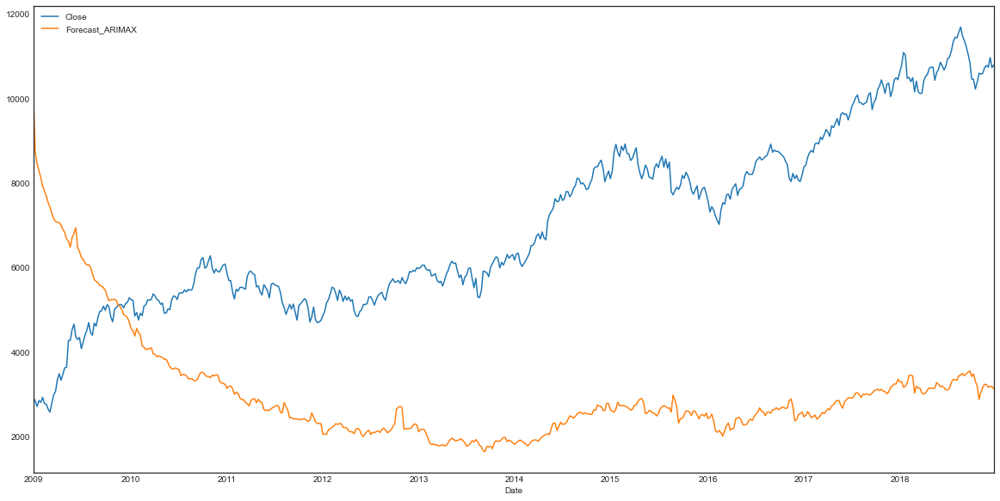

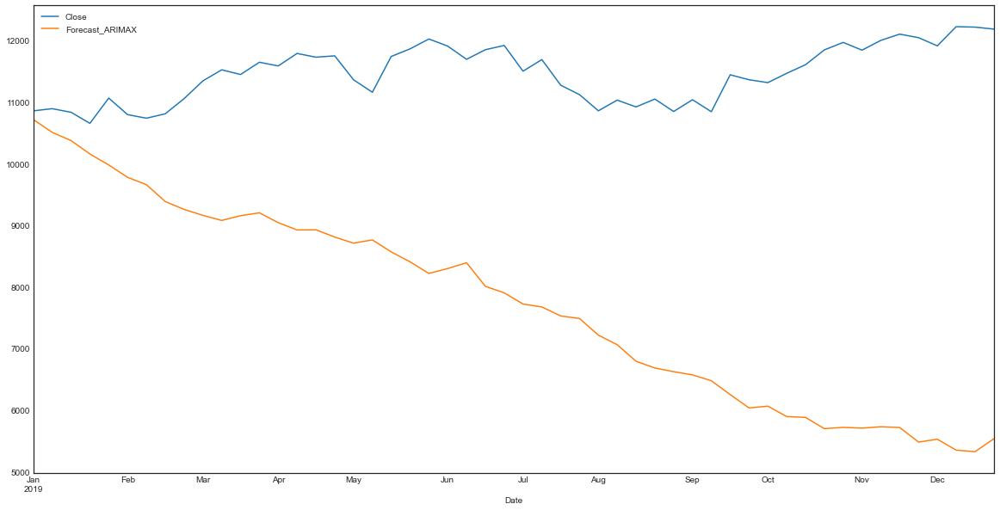

In [46]:
weekmodel7 = model(train_before_lockdown, valid_before_lockdown, exogenous_features_with_vlolume, True)
weekmodel7.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=7778.937, Time=1.29 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=10280.157, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.63 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=7708.254, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=7041.133, Time=0.82 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=8322.378, Time=0.33 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=7775.363, Time=1.11 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=7748.109, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.84 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=7078.556, Time=0.89 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 7.184 seconds
train MSE of Auto ARIMAX: 23941870.761423957
train RMSE of Auto ARIMAX: 4893.043098259401
train MAE of Auto ARIMAX: 4464.34425419144
valid MSE of Auto ARIMAX: 17514181.98925647
valid RMSE of Auto ARIMAX: 4184.994861317809
valid M

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  522
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -3509.566
Date:                Mon, 29 Nov 2021   AIC                           7041.133
Time:                        01:31:02   BIC                           7087.967
Sample:                    01-01-2009   HQIC                          7059.477
                         - 12-27-2018                                         
Covariance Type:                  opg                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
High_mean_lag4       0.7079      0.204      3.474      0.001       0.309       1.107
High_std_lag4       -0.5845      0.127     -4.600      0.000      -0.834      -0.336
Low_mean_lag4       -0.3820      0.194     -1.971      0.049      -0.762      -0.002
Low_std_lag4         1.3316      0.096     13.943      0.000       1.144       1.519
Volume_mean_lag4    -0.0005      0.000     -4.301      0.000      -0.001      -0.000
Volume_std_lag4      0.0001      0.000      1.082      0.279      -0.000       0.000
Month              -19.3833     14.380     -1.348      0.178     -47.567       8.800
Week                 6.5121      3.176      2.050      0.040       0.287      12.737
ar.L1                0.9807      0.002    587.338      0.000       0.977       0.984
ma.L1                0.2348      0.035      6.653      0.000       0.166       0.304
sigma2            2.769e+04      0.007   3.75e+06      0.000    2.77e+04    2.77e+04
===================================================================================
Ljung-Box (L1) (Q):                   6.30   Jarque-Bera (JB):               116.19
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               1.17   Skew:                             0.19
Prob(H) (two-sided):                  0.29   Kurtosis:                         5.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.33e+22. Standard errors may be unstable.
"""

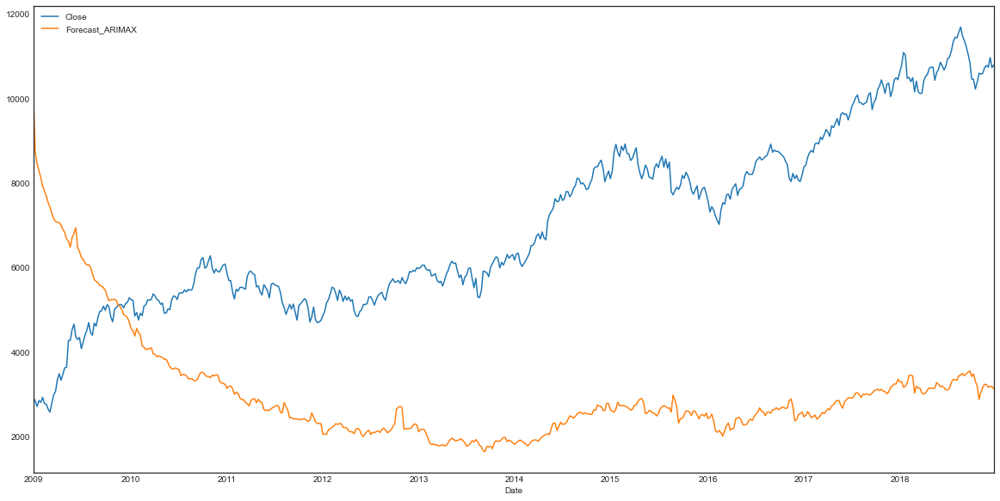

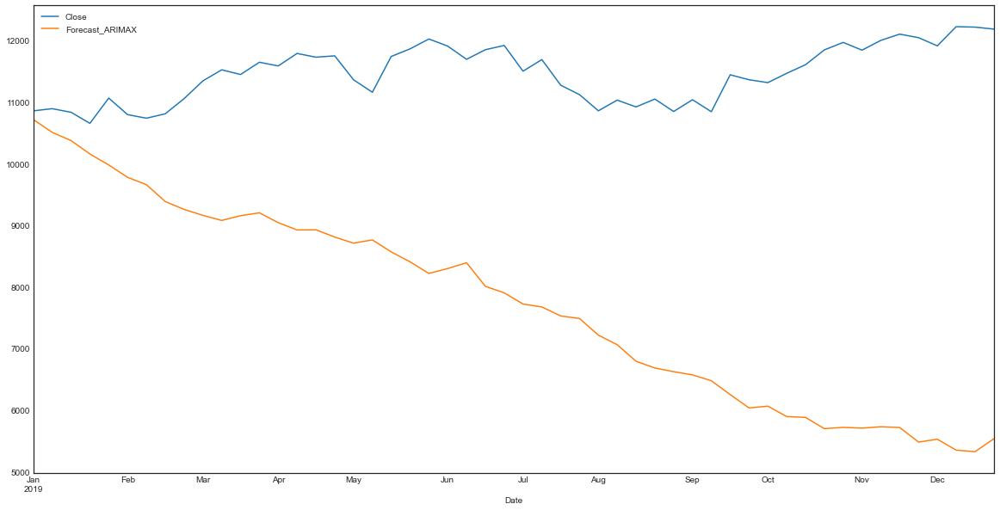

In [47]:
weekmodel8 = model(train_before_lockdown, valid_before_lockdown, exogenous_features_with_vlolume, False)
weekmodel8.summary()

In [48]:
monthly.describe()

,Open,High,Low,Close,Adj Close,Volume
count,156.000000,156.000000,156.000000,156.000000,156.000000,1.560000e+02
mean,8333.062484,8651.215077,8042.106114,8407.602553,8407.602553,4.184492e+06
std,3262.119101,3372.527956,3227.918797,3301.713353,3301.713353,4.324979e+06
min,2764.600098,2969.750000,2539.449951,2763.649902,2763.649902,0.000000e+00
25%,5597.650025,5813.637574,5343.325195,5640.474975,5640.474975,0.000000e+00
50%,8023.299805,8291.550293,7719.000000,8112.949952,8112.949952,3.433650e+06
75%,10733.874756,10985.725342,10308.162109,10736.950195,10736.950195,5.144825e+06
max,17783.150391,18604.449219,17452.900391,17671.650391,17671.650391,2.130300e+07


In [49]:
#Creating a copy
monthly_analysis=monthly.copy()

#Coverting date column to datetime data type
monthly_analysis['Date'] = monthly_analysis['Date'].apply(pd.to_datetime)

#Extracting Month, Week, Day,Day of week
monthly_analysis["Month"] = monthly_analysis.Date.dt.month

#Setting date column as index
monthly_analysis.set_index("Date", drop=False, inplace=True)
monthly_analysis.iloc[:,15:19].head()
#Imputing null values with mean 
monthly_analysis.fillna(monthly_analysis.mean(),inplace=True)

#Checking for null values
monthly_analysis.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Month        0
dtype: int64

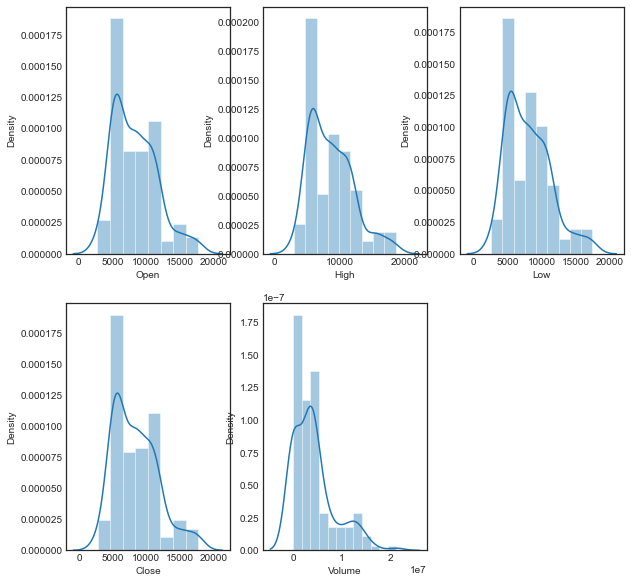

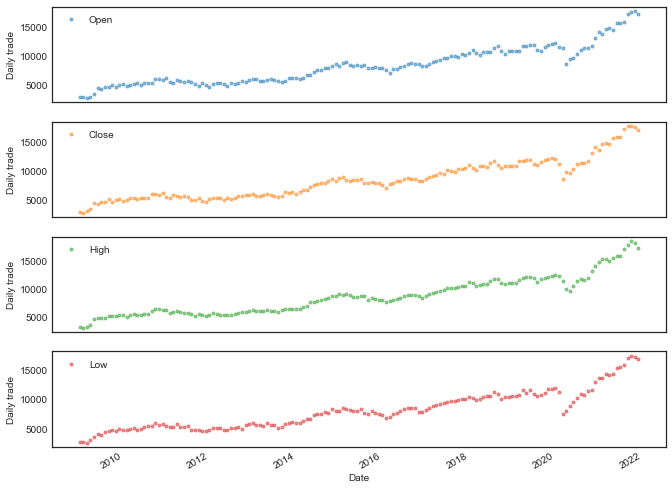

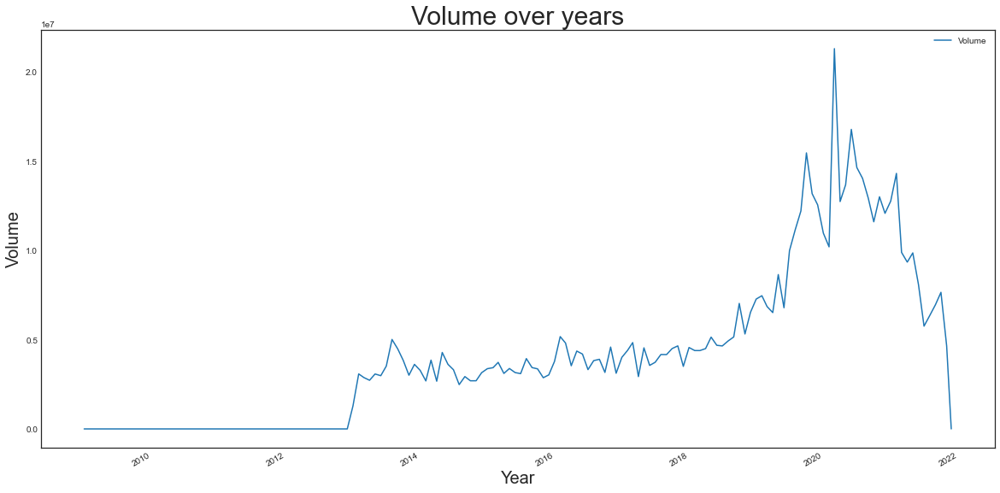

In [50]:
plot_prices(monthly_analysis)

In [51]:
compare_prices(monthly_analysis, 'Open', 'Close')
compare_prices(monthly_analysis, 'High', 'Low')

In [52]:
train_before_lockdown = monthly_analysis[monthly_analysis.Date < "2019"]
valid_before_lockdown = monthly_analysis[monthly_analysis.Date >= "2019"][monthly_analysis.Date < "2020"]
train_including_lockdown = monthly_analysis[monthly_analysis.Date < "2021"]
valid_including_lockdown = monthly_analysis[monthly_analysis.Date >= "2021"]
exogenous_features = ["Month"]

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2156.888, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2149.593, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2151.588, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2151.588, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2152.033, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2153.586, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 0.410 seconds
train MSE of Auto ARIMAX: 140068906.56402418
train RMSE of Auto ARIMAX: 11835.071041781886
train MAE of Auto ARIMAX: 11783.31506392411
valid MSE of Auto ARIMAX: 3433609.854979895
valid RMSE of Auto ARIMAX: 1853.0002307015222
valid MAE of Auto ARIMAX: 1564.4828492011336


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  144
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1071.796
Date:                Mon, 29 Nov 2021   AIC                           2149.593
Time:                        01:31:05   BIC                           2158.481
Sample:                    01-01-2009   HQIC                          2153.205
                         - 12-01-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     77.2935     39.555      1.954      0.051      -0.232     154.819
Month          4.3823     12.469      0.351      0.725     -20.056      28.820
sigma2      1.895e+05   1.04e+04     18.265      0.000    1.69e+05     2.1e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               538.82
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               3.82   Skew:                            -1.30
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

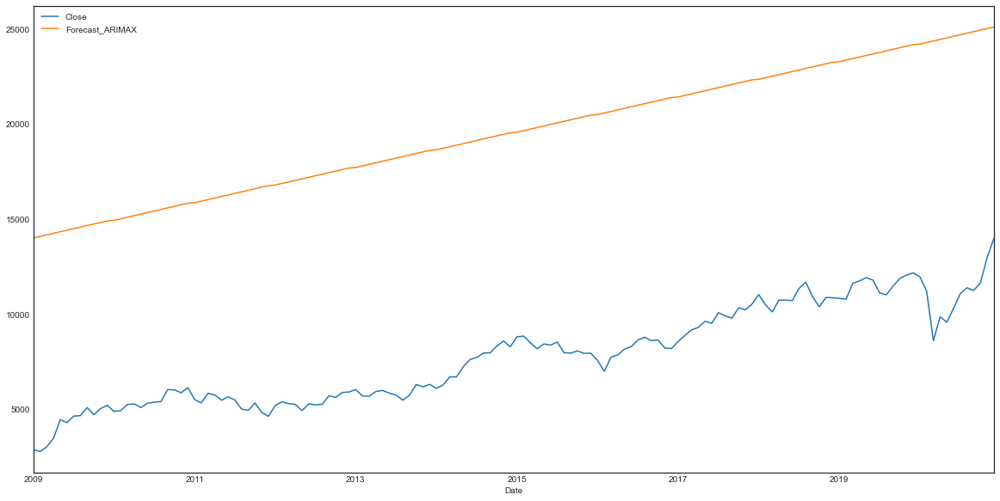

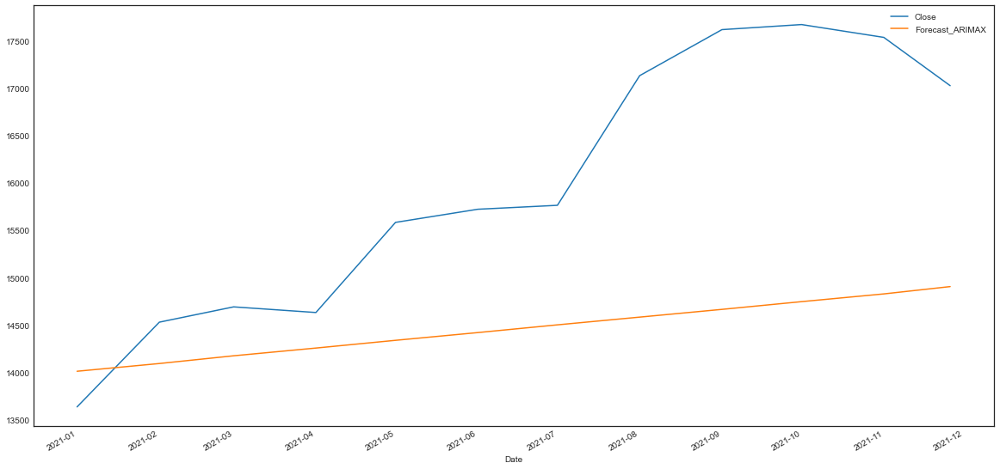

In [53]:
monthmodel1 = model(train_including_lockdown, valid_including_lockdown, exogenous_features, True)
monthmodel1.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2156.888, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2149.593, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2151.588, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2151.588, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2152.033, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=2153.586, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 0.366 seconds
train MSE of Auto ARIMAX: 140068906.56402418
train RMSE of Auto ARIMAX: 11835.071041781886
train MAE of Auto ARIMAX: 11783.31506392411
valid MSE of Auto ARIMAX: 3433609.854979895
valid RMSE of Auto ARIMAX: 1853.0002307015222
valid MAE of Auto ARIMAX: 1564.4828492011336


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  144
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1071.796
Date:                Mon, 29 Nov 2021   AIC                           2149.593
Time:                        01:31:06   BIC                           2158.481
Sample:                    01-01-2009   HQIC                          2153.205
                         - 12-01-2020                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     77.2935     39.555      1.954      0.051      -0.232     154.819
Month          4.3823     12.469      0.351      0.725     -20.056      28.820
sigma2      1.895e+05   1.04e+04     18.265      0.000    1.69e+05     2.1e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               538.82
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               3.82   Skew:                            -1.30
Prob(H) (two-sided):                  0.00   Kurtosis:                        12.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

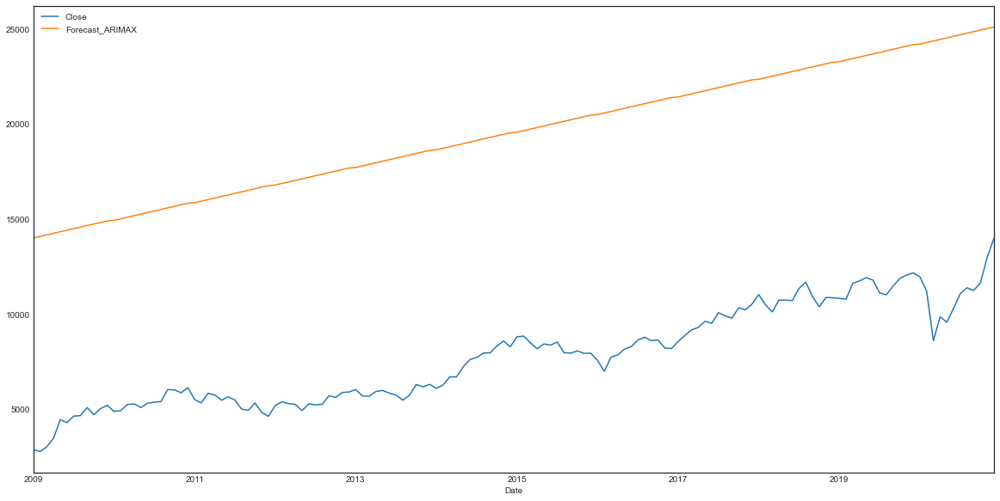

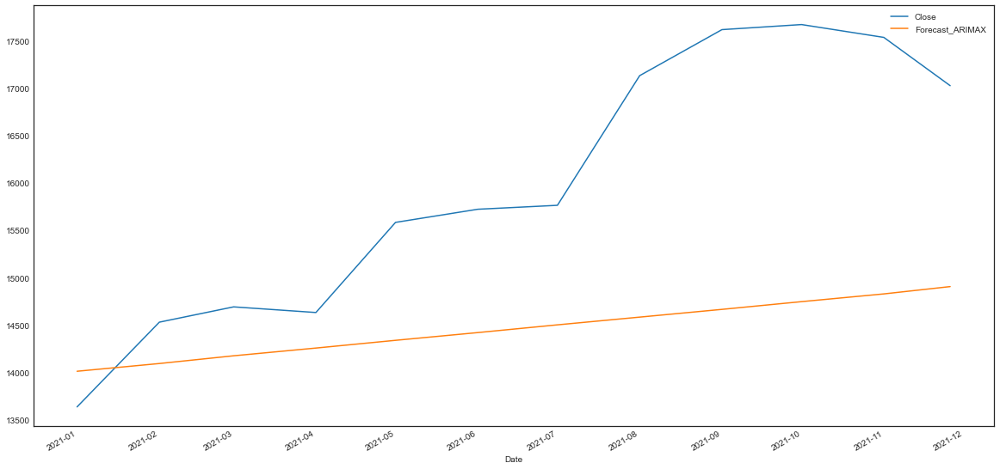

In [54]:
monthmodel2 = model(train_including_lockdown, valid_including_lockdown, exogenous_features, False)
monthmodel2.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1719.167, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1720.369, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1721.491, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1720.985, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1723.325, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1720.210, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1719.004, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1723.640, Time=0.16 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1718.359, Time=0.11 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1717.373, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=1719.367, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1719.356, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=1721.359, Time=0.20 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=1720.860, Time=0.06 sec

Best model:  ARIMA(3,1,0)(0,0,0)

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  120
Model:               SARIMAX(3, 1, 0)   Log Likelihood                -852.686
Date:                Mon, 29 Nov 2021   AIC                           1717.373
Time:                        01:31:08   BIC                           1734.047
Sample:                    01-01-2009   HQIC                          1724.144
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     70.6405     34.296      2.060      0.039       3.421     137.860
Month          3.4782      7.683      0.453      0.651     -11.580      18.536
ar.L1         -0.0695      0.094     -0.740      0.459      -0.254       0.115
ar.L2         -0.1899      0.099     -1.918      0.055      -0.384       0.004
ar.L3          0.1623      0.109      1.493      0.136      -0.051       0.375
sigma2      9.875e+04   1.34e+04      7.371      0.000    7.25e+04    1.25e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.06
Prob(Q):                              0.98   Prob(JB):                         0.97
Heteroskedasticity (H):               1.15   Skew:                            -0.05
Prob(H) (two-sided):                  0.65   Kurtosis:                         3.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

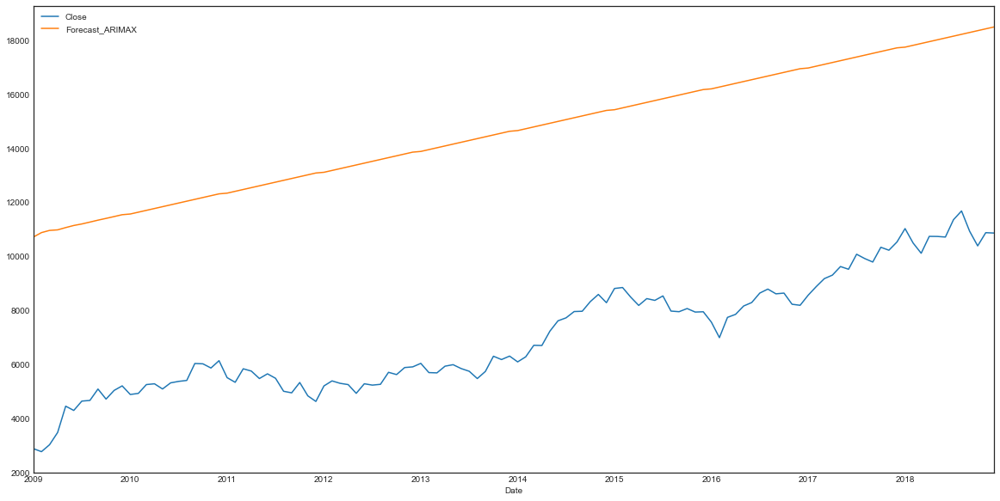

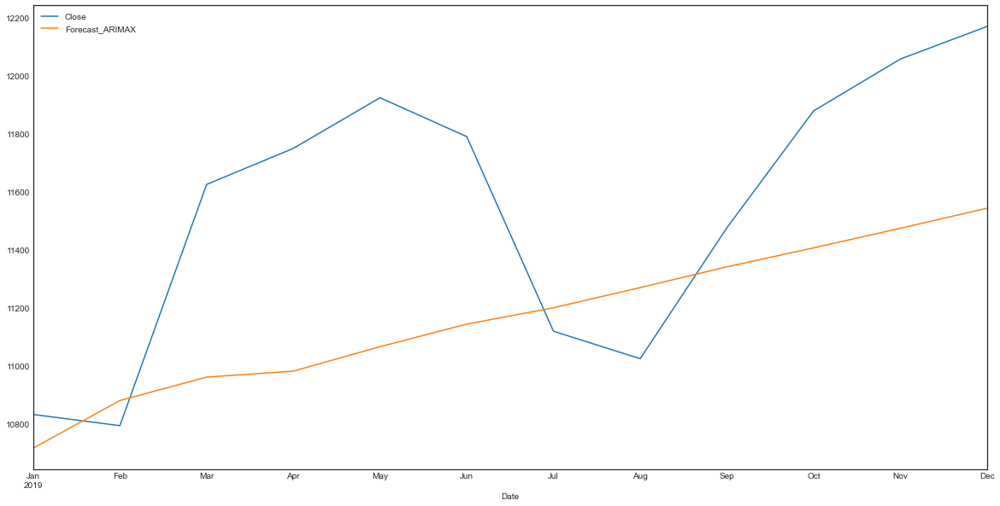

In [55]:
monthmodel3 =model(train_before_lockdown, valid_before_lockdown, exogenous_features, True)
monthmodel3.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=1719.167, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1720.369, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=1721.491, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1720.985, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1723.325, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=1720.210, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=1719.004, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=1723.640, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=1718.359, Time=0.10 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=1717.373, Time=0.08 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=1719.367, Time=0.15 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=1719.356, Time=0.19 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=1721.359, Time=0.22 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=1720.860, Time=0.07 sec

Best model:  ARIMA(3,1,0)(0,0,0)

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  120
Model:               SARIMAX(3, 1, 0)   Log Likelihood                -852.686
Date:                Mon, 29 Nov 2021   AIC                           1717.373
Time:                        01:31:11   BIC                           1734.047
Sample:                    01-01-2009   HQIC                          1724.144
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     70.6405     34.296      2.060      0.039       3.421     137.860
Month          3.4782      7.683      0.453      0.651     -11.580      18.536
ar.L1         -0.0695      0.094     -0.740      0.459      -0.254       0.115
ar.L2         -0.1899      0.099     -1.918      0.055      -0.384       0.004
ar.L3          0.1623      0.109      1.493      0.136      -0.051       0.375
sigma2      9.875e+04   1.34e+04      7.371      0.000    7.25e+04    1.25e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.06
Prob(Q):                              0.98   Prob(JB):                         0.97
Heteroskedasticity (H):               1.15   Skew:                            -0.05
Prob(H) (two-sided):                  0.65   Kurtosis:                         3.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

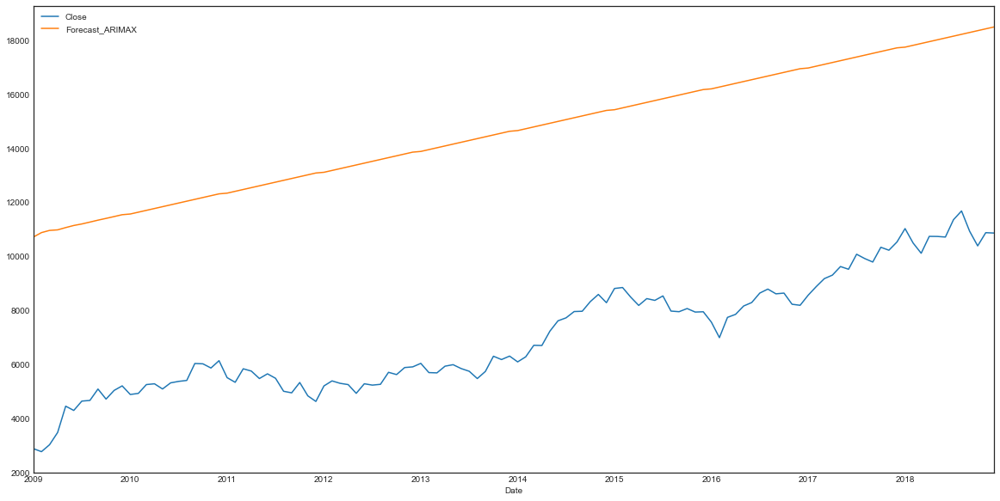

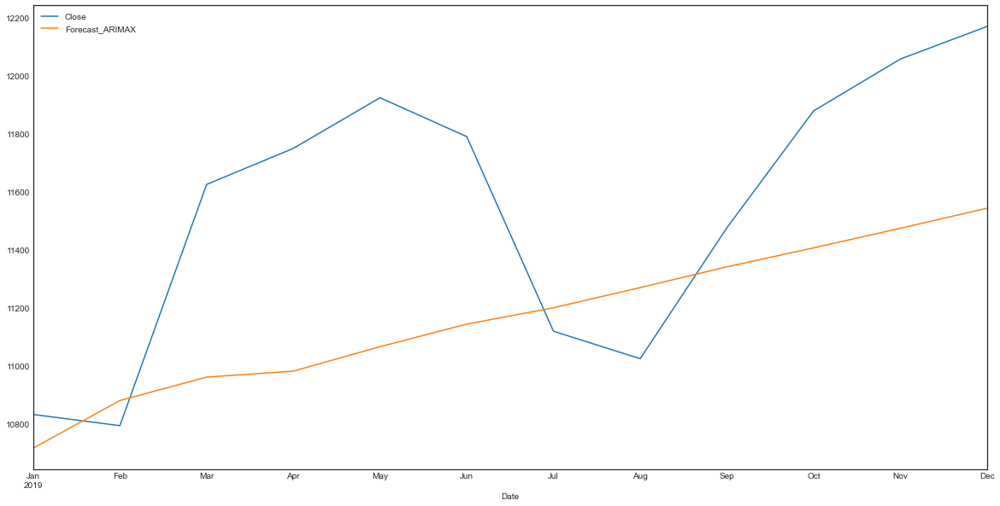

In [56]:
monthmodel4 = model(train_before_lockdown, valid_before_lockdown, exogenous_features, False)
monthmodel4.summary()